In [2]:
import h5py

In [3]:
filename = 'concat_31Hz.h5'
f = h5py.File(filename, 'r')
list(f.keys())

['data']

In [4]:
pvc7 = f['data']

In [5]:
pvc7.shape

(255256, 512, 1154)

In [6]:
pvc7.dtype

dtype('uint8')

In [7]:
pvc7[0]

array([[ 0,  0,  8, ...,  6,  7,  6],
       [ 0,  0,  6, ...,  6,  6, 24],
       [ 0,  0,  4, ...,  6,  7,  6],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as wg
from IPython.display import display

In [132]:
def imaging(f):
    a = pvc7[f]
    plt.imshow(a, cmap='hot', interpolation='nearest')
#     plt.ylim(300,200)
#     plt.xlim(300,400) ## cell 1 & 2
#     plt.ylim(212,195)
#     plt.xlim(180,210) ## cell 3
#     plt.ylim(135,145)
#     plt.xlim(325,345) ## cell 4
#     plt.ylim(223,210)
#     plt.xlim(320,340) ## cell 5
#     plt.ylim(175,160)
#     plt.xlim(340,360) ## cell6 [160:175, 340:360]
#     plt.ylim(325,310)
#     plt.xlim(400,420) ## cell7 [325:310, 400:420]
#     plt.ylim(215,200)
#     plt.xlim(260,280) ## cell9 [200:215, 260:280] 
#     plt.ylim(400,0)
#     plt.xlim(100,600) ## main global
#     plt.ylim(250,240)
#     plt.xlim(180,195) ## cell14 [240:250, 180:195]

f_slide=wg.IntSlider(min = 0, max=255255, value=100477, description = 'Frame:')
wg.interact(imaging, f=f_slide)

interactive(children=(IntSlider(value=100477, description='Frame:', max=255255), Output()), _dom_classes=('wid…

<function __main__.imaging(f)>

In [137]:
def imaging(f):
    smalldset3000 = np.mean(pvc7[f:(f+3000)],axis=0)
    plt.imshow(smalldset3000, interpolation='nearest')
    plt.ylim(400,0)
    plt.xlim(100,600)
    
f_slide=wg.IntSlider(min = 0, max=255255-3000, value=100477, description = 'Frame:')
wg.interact(imaging, f=f_slide)

# smalldset3000 = np.mean(pvc7[18000:(18000+3000),:,:],axis=0)
# plt.imshow(smalldset3000)
# plt.ylim(400,0)
# plt.xlim(100,600)

interactive(children=(IntSlider(value=100477, description='Frame:', max=252255), Output()), _dom_classes=('wid…

<function __main__.imaging(f)>

In [11]:
import pandas as pd
stim = pd.read_csv("stimulus.csv")
stim

,start,end,ori,sf,tf,contrast
0,31141,31231,0,0.02,1,0.8
1,86248,86338,0,0.02,1,0.8
2,87900,87990,0,0.02,1,0.8
3,112976,113066,0,0.02,1,0.8
4,132196,132286,0,0.02,1,0.8
...,...,...,...,...,...,...
1595,64175,64265,315,0.32,15,0.8
1596,70632,70722,315,0.32,15,0.8
1597,87750,87840,315,0.32,15,0.8
1598,198865,198955,315,0.32,15,0.8


In [12]:
# experiment design. conditions information

oris = list(stim['ori'].value_counts().keys())
num_oris = len(oris)

tfs = list(stim['tf'].value_counts().keys())
num_tfs = len(tfs)

sfs = list(stim['sf'].value_counts().keys())
num_sfs = len(sfs)

num_conds = num_oris * num_tfs * num_sfs

oris.sort()
tfs.sort()
sfs.sort()

print ('oris:', oris, '\n',
      'tfs:', tfs,'\n',
      'sfs:', sfs,'\n',
      'number of conditions:', num_conds)

oris: [0, 45, 90, 135, 180, 225, 270, 315] 
 tfs: [1, 2, 4, 8, 15] 
 sfs: [0.02, 0.04, 0.08, 0.16, 0.32] 
 number of conditions: 200


In [13]:
def cal_idx2(ori, tf, sf, top, bottom, left, right):
    tf = tf
    sf = sf
    d = stim[(stim.ori == ori) & (stim.tf == tf) & (stim.sf == sf)]
    idx_save = []
    for i in np.arange(len(d)):
        start_times = list(d['start'])
        F0 = np.mean(pvc7[(start_times[i]-30):(start_times[i]-0), top:bottom, left:right],axis=0)
#         F0 = np.mean(F0)
        F1 = np.mean(pvc7[start_times[i]:start_times[i]+90, top:bottom, left:right],axis = 0)
#         F1 = np.mean(F1)
        idx = (F1-F0)/F0
        idx = np.mean(idx)
        idx_save.append(idx)
    return idx_save # 4D list, (nth repeat of this condition, timepoints, 2D of the field)

In [24]:
# cell1 [240:255, 360:380]
results_cell1 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 240,bottom=255, left=360,right =380)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell1.append(ts) #3 dimensions: 5tf 5sf 8ori

In [25]:
resultdf_cell1 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell1[i][j][k]
                                }
            resultdf_cell1.append(resultdf_element)
resultdf_cell1 = pd.DataFrame(resultdf_cell1)
# resultdf_cell1

Text(0.07, 0.5, 'df/f')

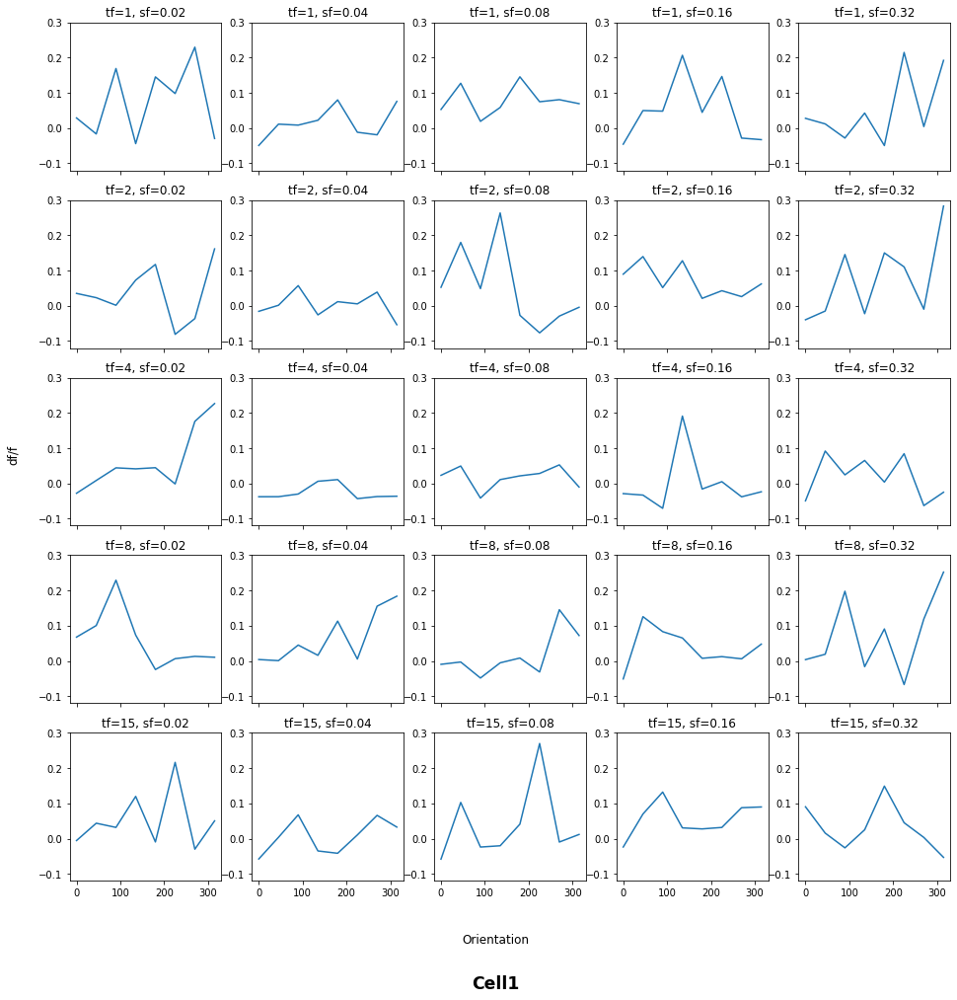

In [26]:
# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell1[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.12, 0.3)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell1', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

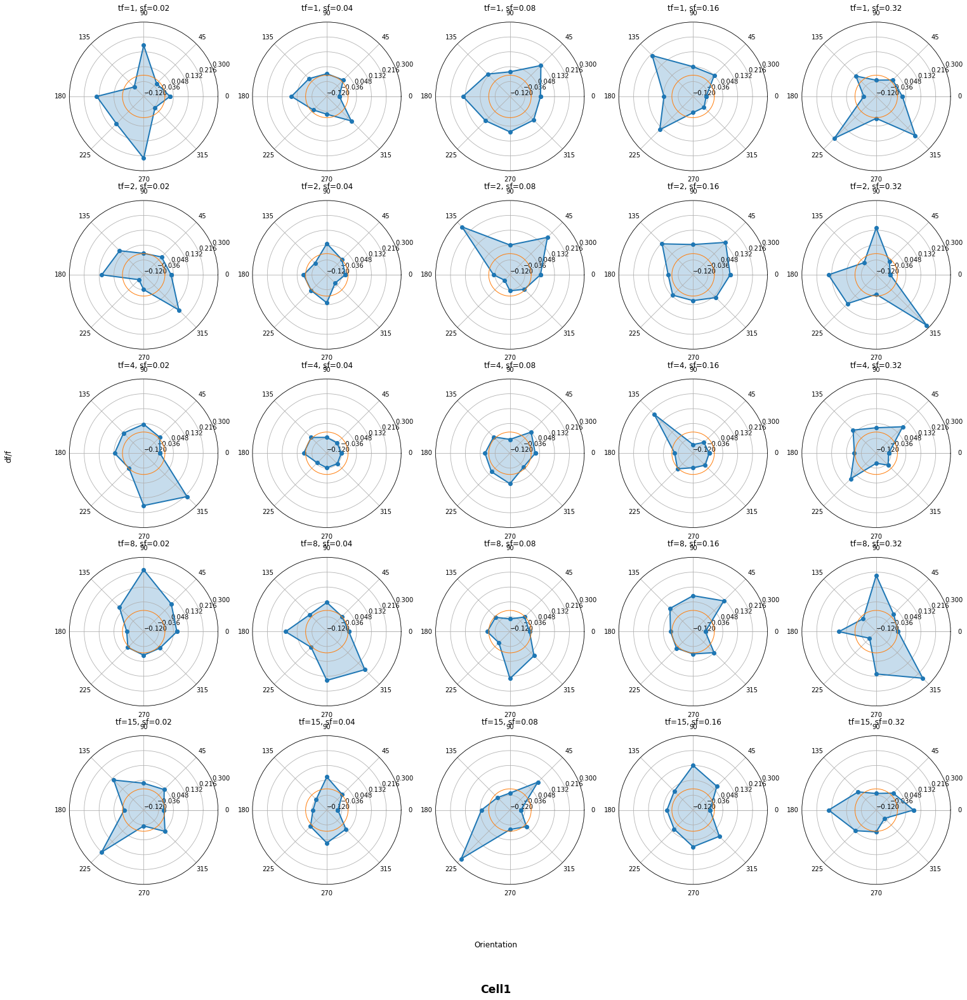

In [129]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell1[i][j] # make changes.
        
        markers = np.linspace(-0.12, 0.3, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell1', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [28]:
# cell2 [255:270, 340:360]
results_cell2 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 255,bottom=270, left=340,right =360)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell2.append(ts) #3 dimensions: 5tf 5sf 8ori

In [29]:
resultdf_cell2 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell2[i][j][k]
                                }
            resultdf_cell2.append(resultdf_element)
resultdf_cell2 = pd.DataFrame(resultdf_cell2)
# resultdf_cell2

Text(0.07, 0.5, 'df/f')

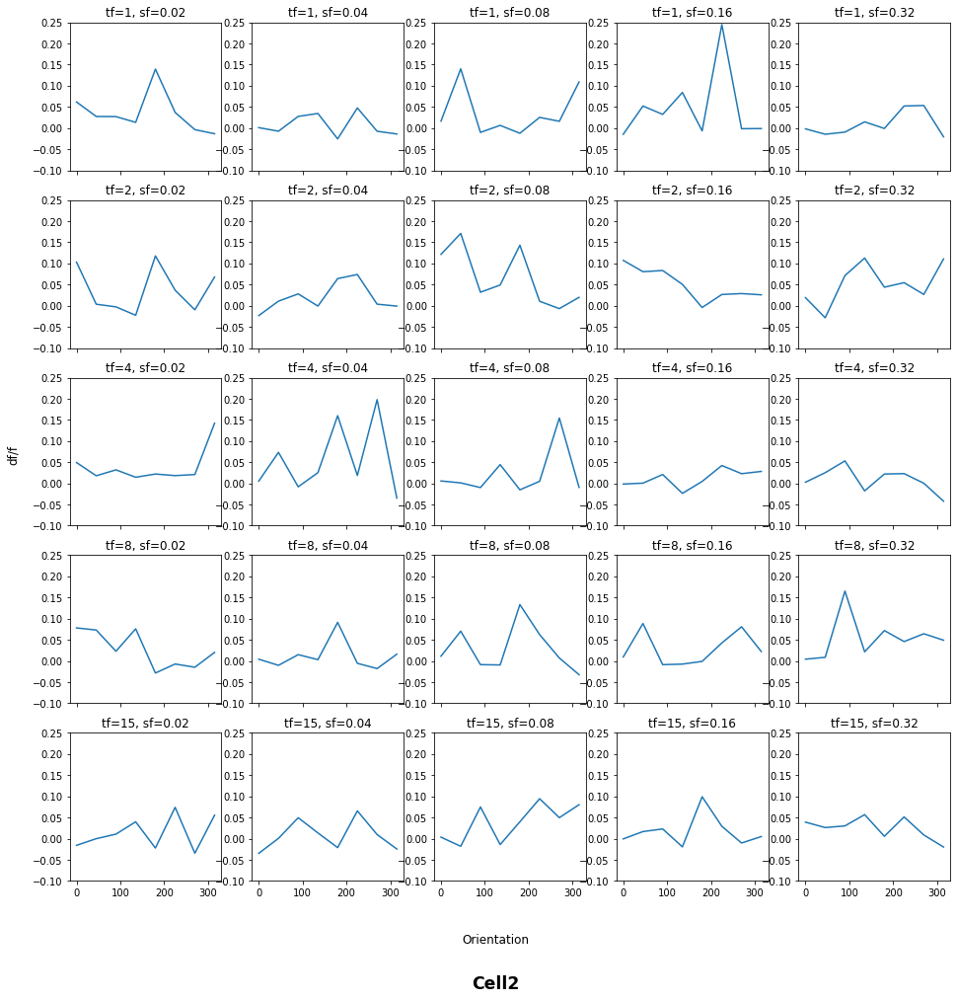

In [30]:
# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell2[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.1, 0.25)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell2', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

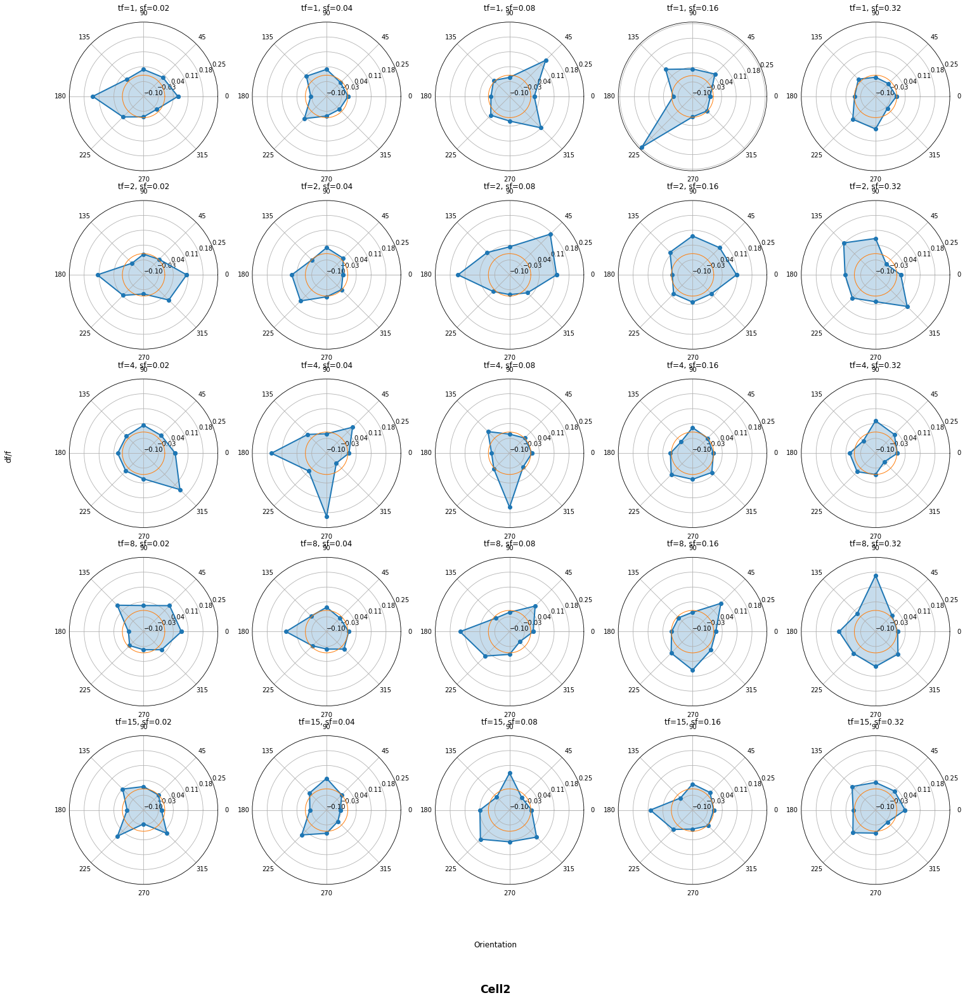

In [128]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell2[i][j] # make changes.
        
        markers = np.linspace(-0.1, 0.25, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell2', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [31]:
# cell3 [195:212, 180:210]
results_cell3 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 195,bottom=212, left=180,right =210)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell3.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

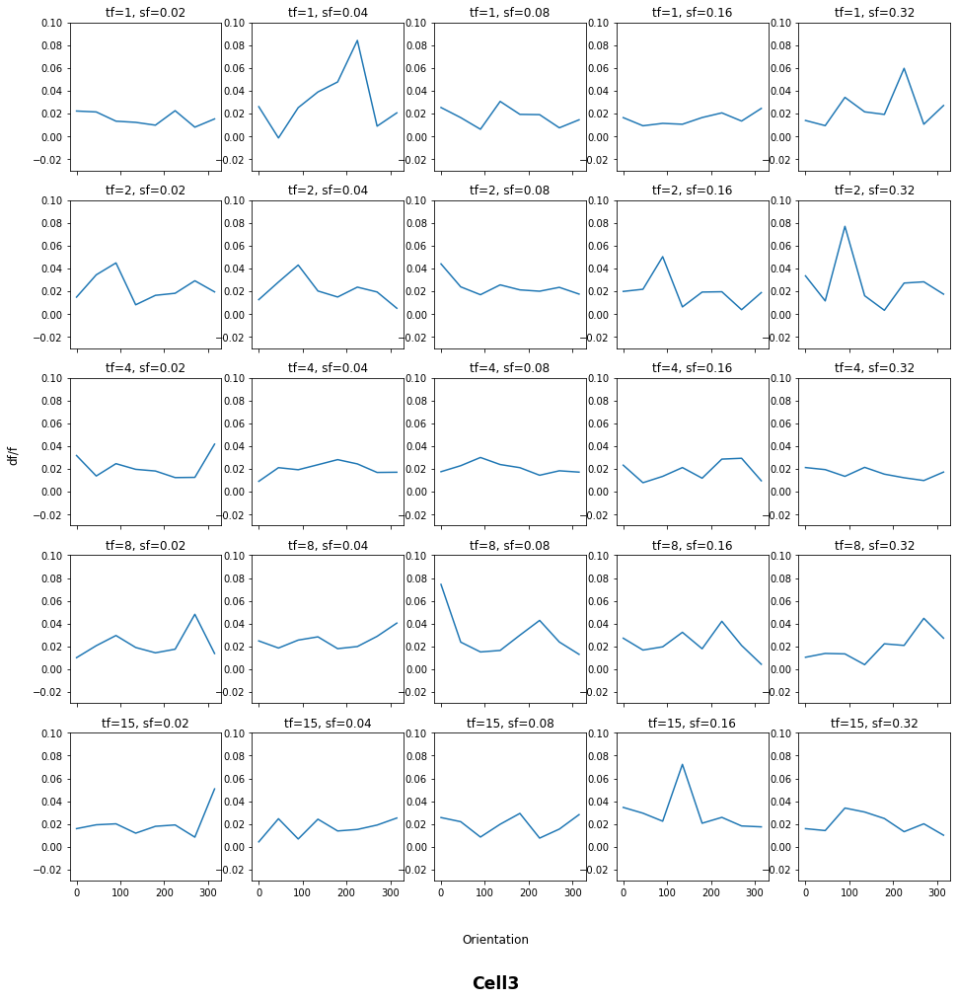

In [32]:
resultdf_cell3 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell3[i][j][k]
                                }
            resultdf_cell3.append(resultdf_element)
resultdf_cell3 = pd.DataFrame(resultdf_cell3)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell3[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.03, 0.1)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell3', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

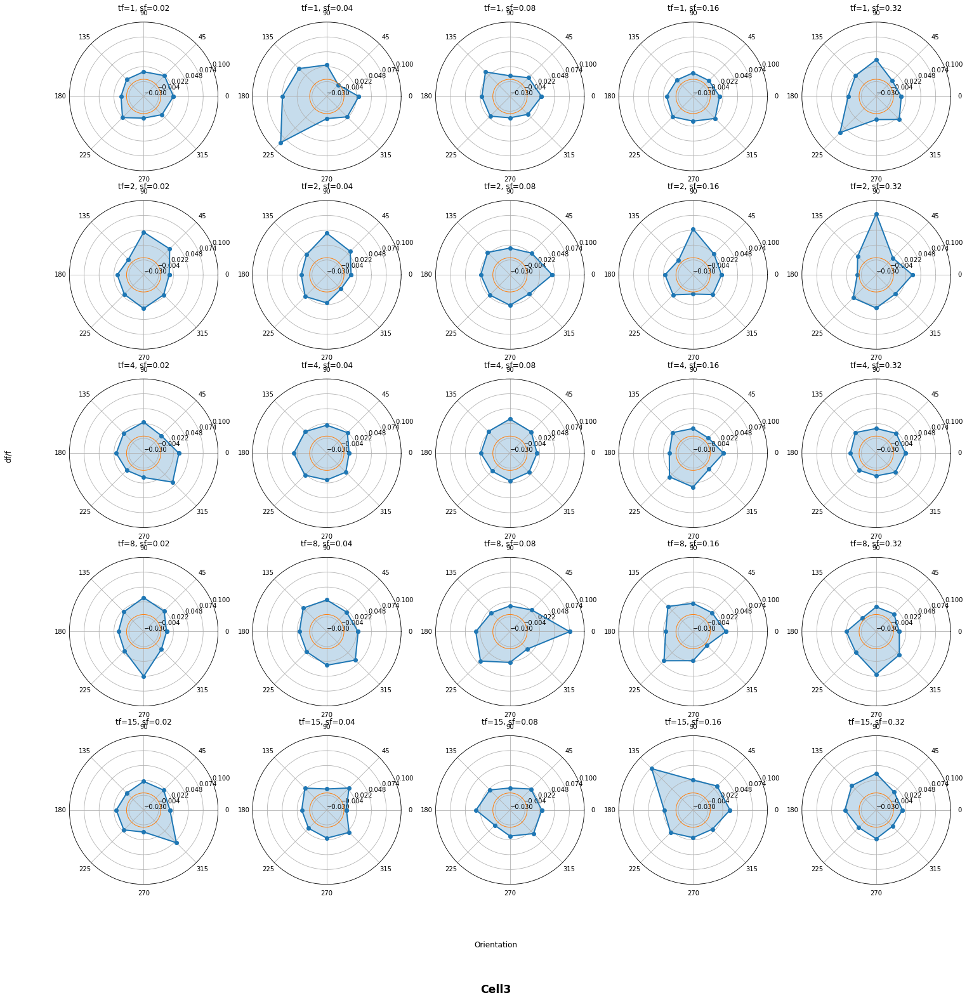

In [126]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell3[i][j] # make changes.
        
        markers = np.linspace(-0.03, 0.1, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell3', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [33]:
# cell4 [135:145, 325:345]
results_cell4 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 135,bottom=145, left=325,right =345)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell4.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

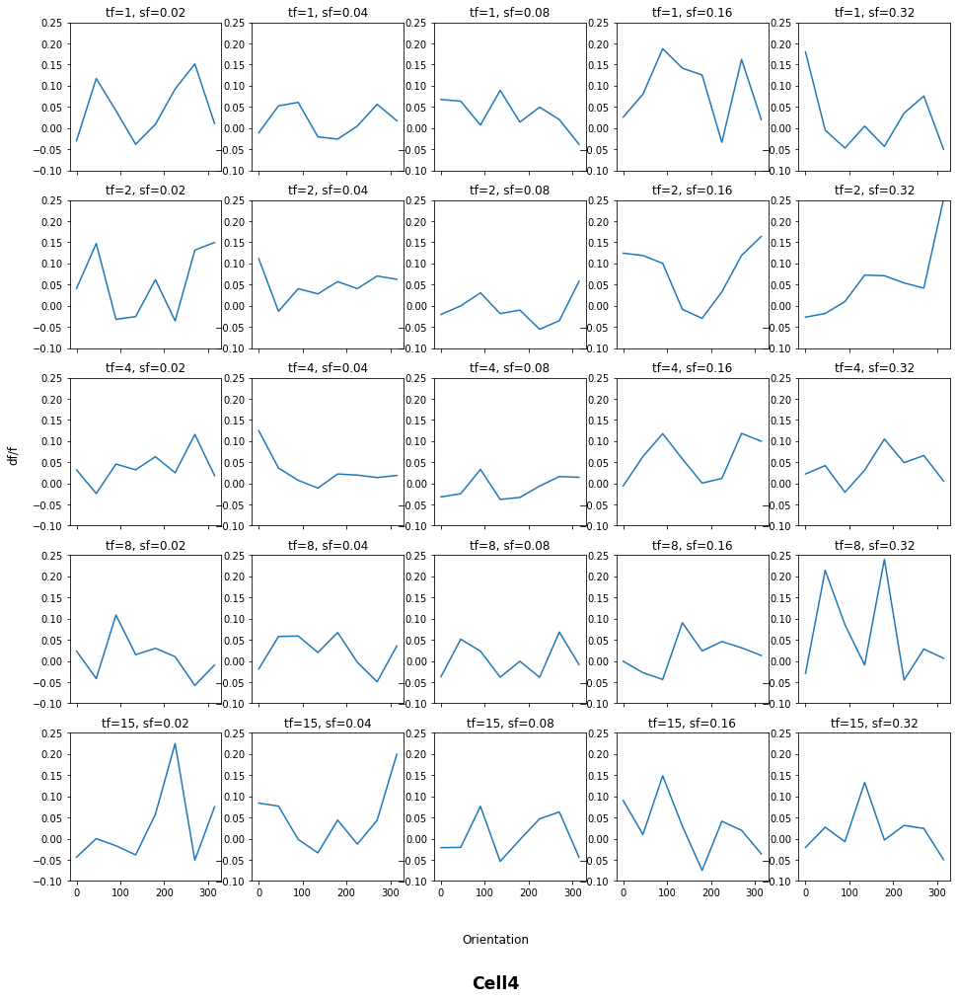

In [34]:
resultdf_cell4 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell4[i][j][k]
                                }
            resultdf_cell4.append(resultdf_element)
resultdf_cell4 = pd.DataFrame(resultdf_cell4)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell4[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.1, 0.25)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell4', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

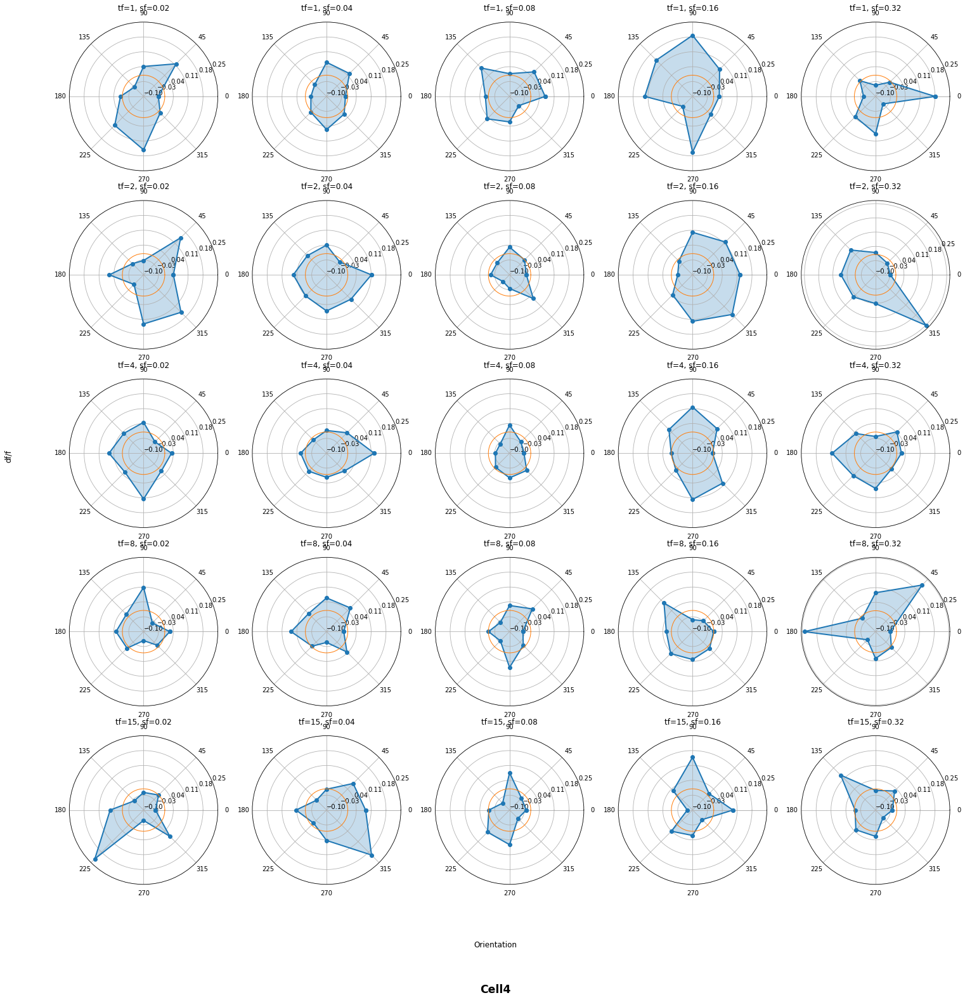

In [124]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell4[i][j] # make changes.
        
        markers = np.linspace(-0.1, 0.25, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell4', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [35]:
# cell5 [210:223; 320:340]

results_cell5 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 210,bottom=223, left=320,right =340)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell5.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

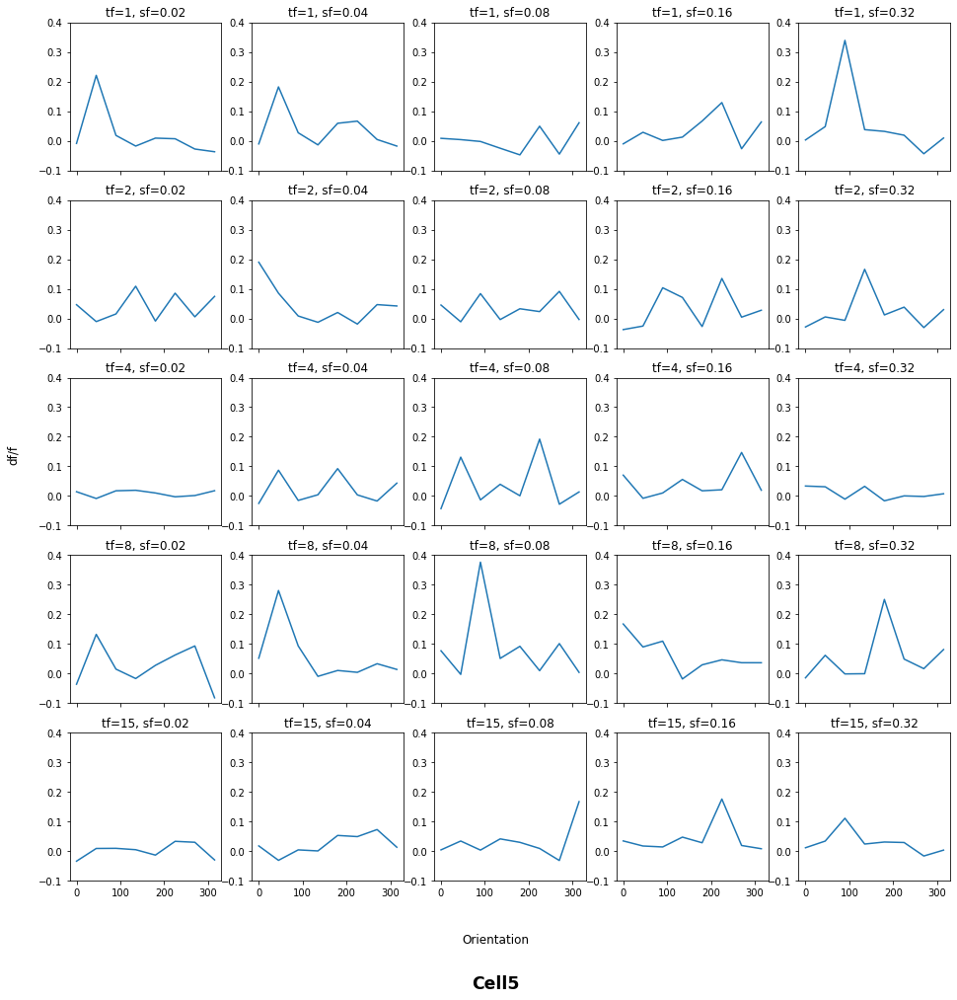

In [36]:
resultdf_cell5 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell5[i][j][k]
                                }
            resultdf_cell5.append(resultdf_element)
resultdf_cell5 = pd.DataFrame(resultdf_cell5)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell5[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.1, 0.4)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell5', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')


Text(0.07, 0.5, 'df/f')

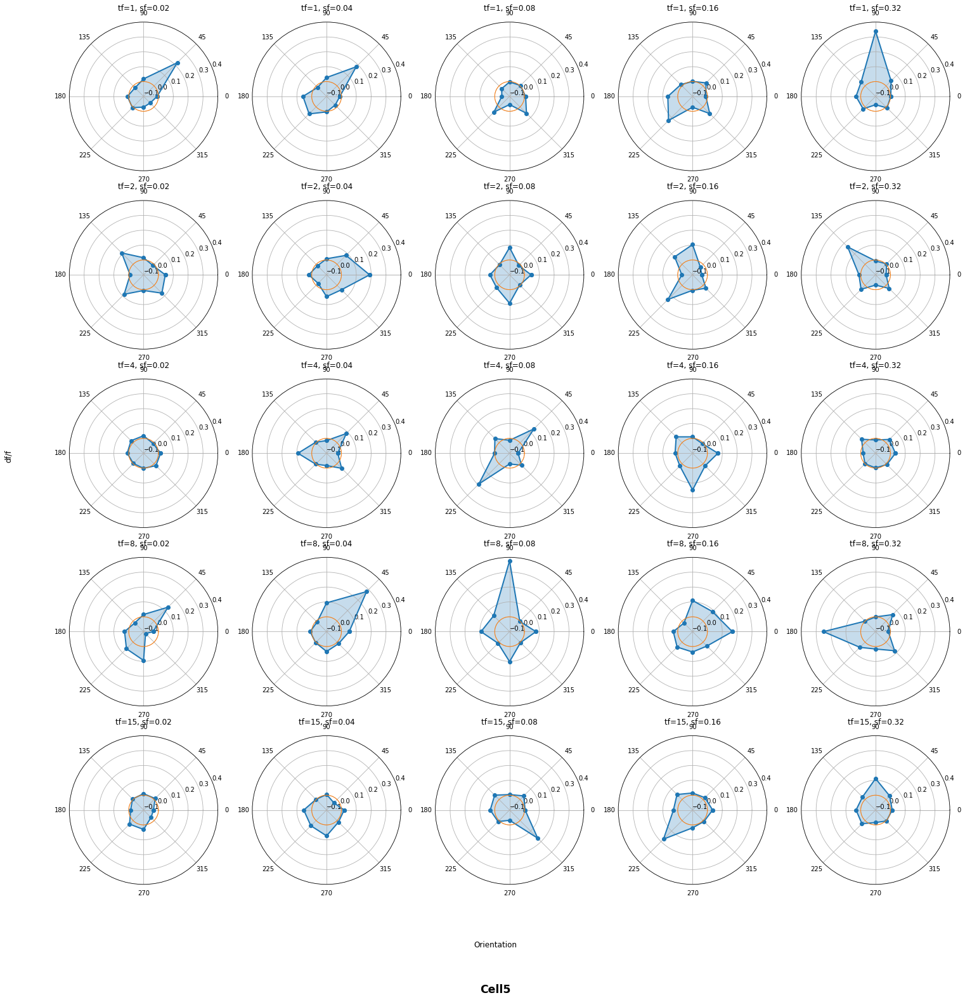

In [37]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell5[i][j] # make changes.
        
        markers = np.linspace(-0.1, 0.4, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell5', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [38]:
# cell6 [160:175, 340:360]
results_cell6 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 160,bottom=175, left=340,right =360)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell6.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

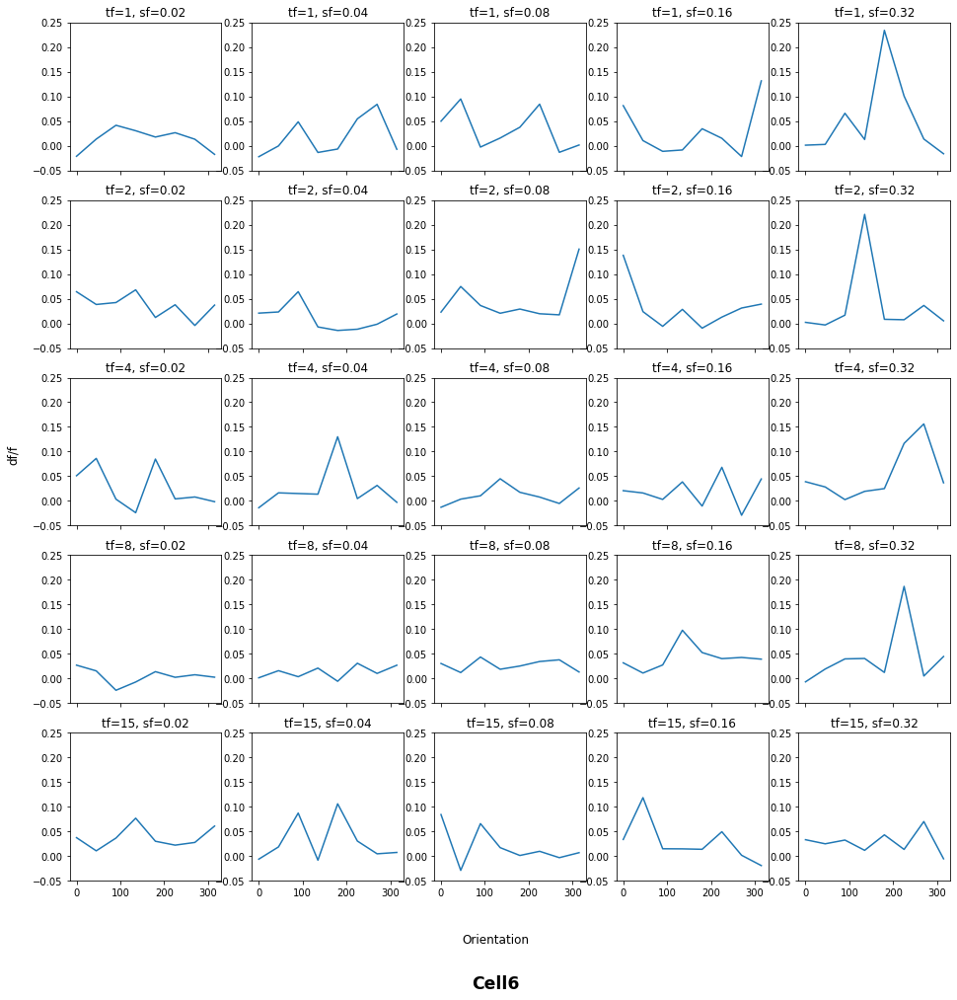

In [39]:
resultdf_cell6 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell6[i][j][k]
                                }
            resultdf_cell6.append(resultdf_element)
resultdf_cell6 = pd.DataFrame(resultdf_cell6)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell6[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.25)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell6', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')



Text(0.07, 0.5, 'df/f')

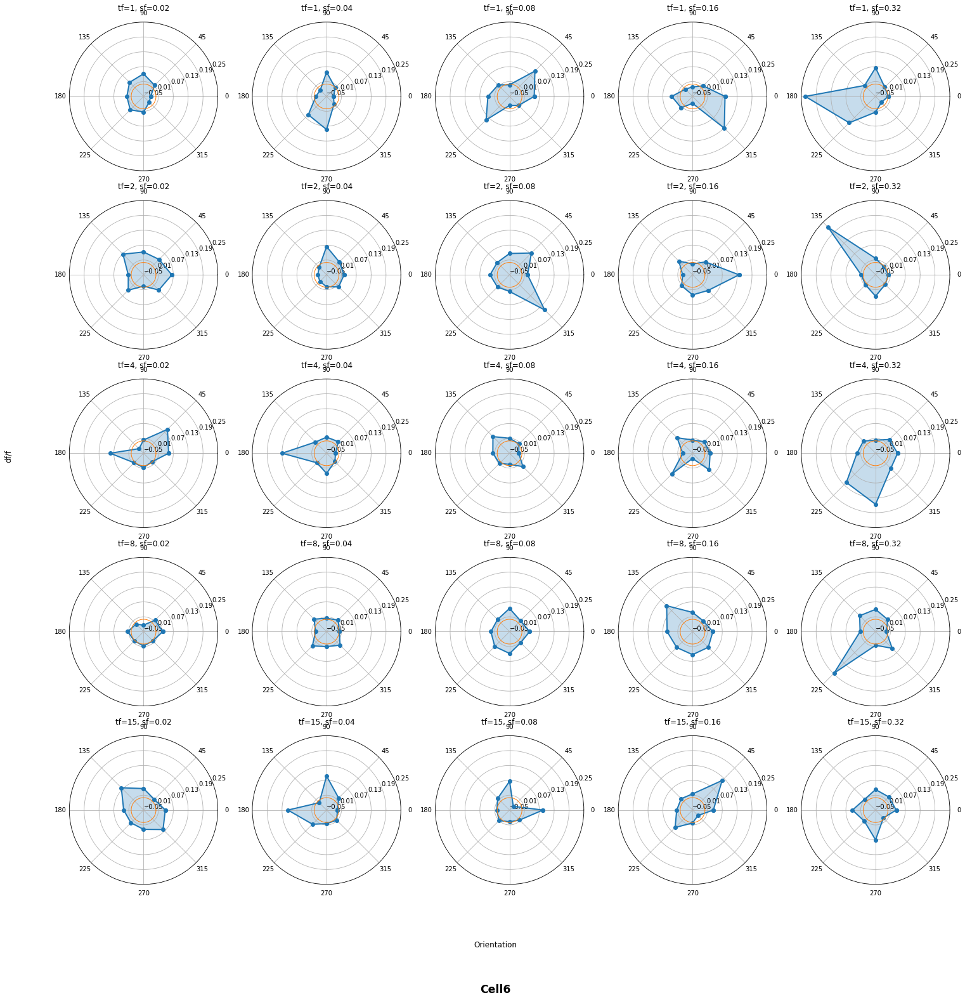

In [40]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell6[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.25, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell6', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [41]:
# cell7 [325:310, 400:420]
results_cell7 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 310,bottom=325, left=400,right =420)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell7.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

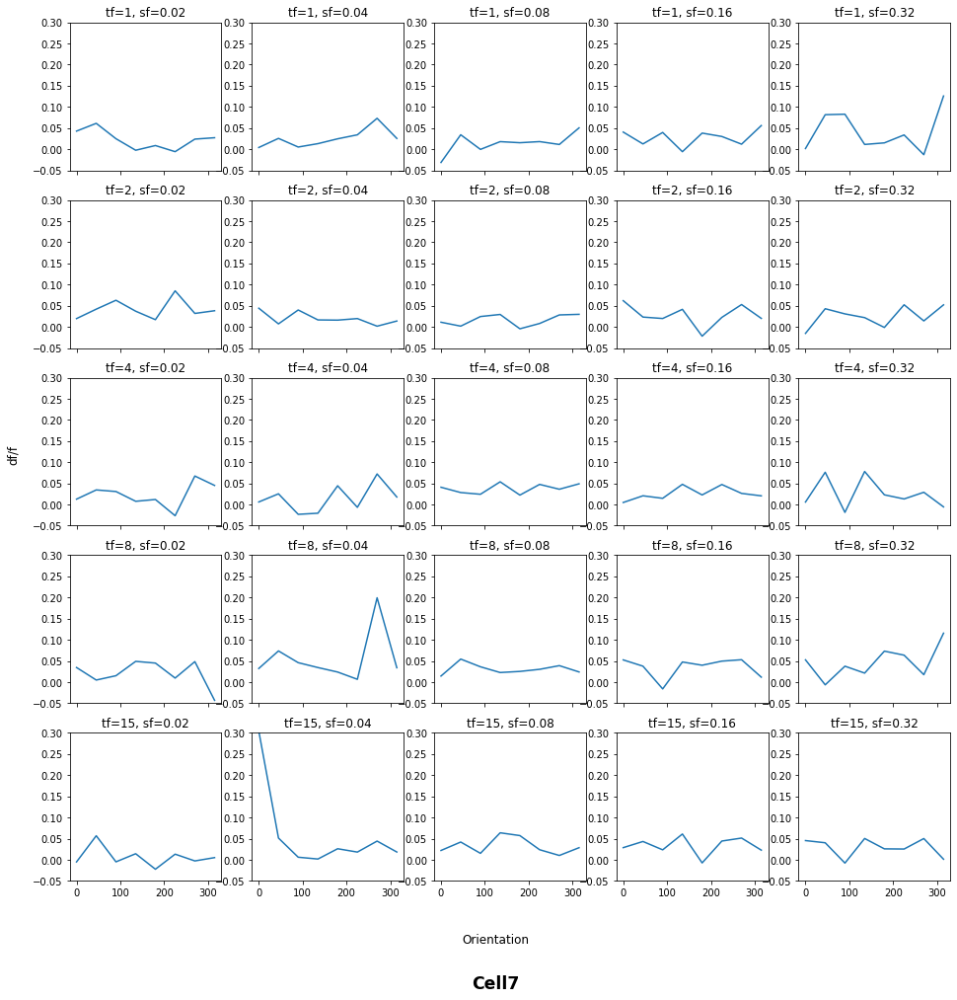

In [42]:
resultdf_cell7 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell7[i][j][k]
                                }
            resultdf_cell7.append(resultdf_element)
resultdf_cell7 = pd.DataFrame(resultdf_cell7)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell7[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.3)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell7', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

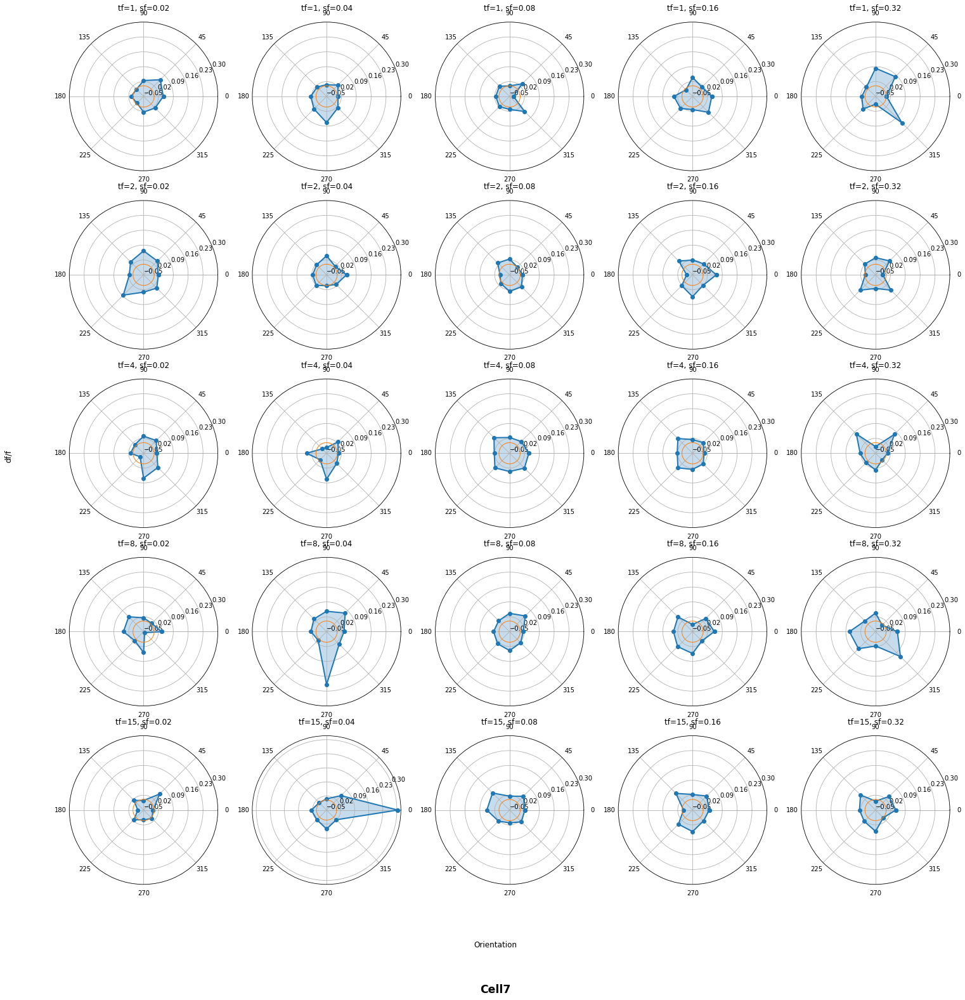

In [43]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell7[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.3, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell7', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [44]:
# cell8 [329:340,467:486]

results_cell8 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 329,bottom=340, left=467,right =486)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell8.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

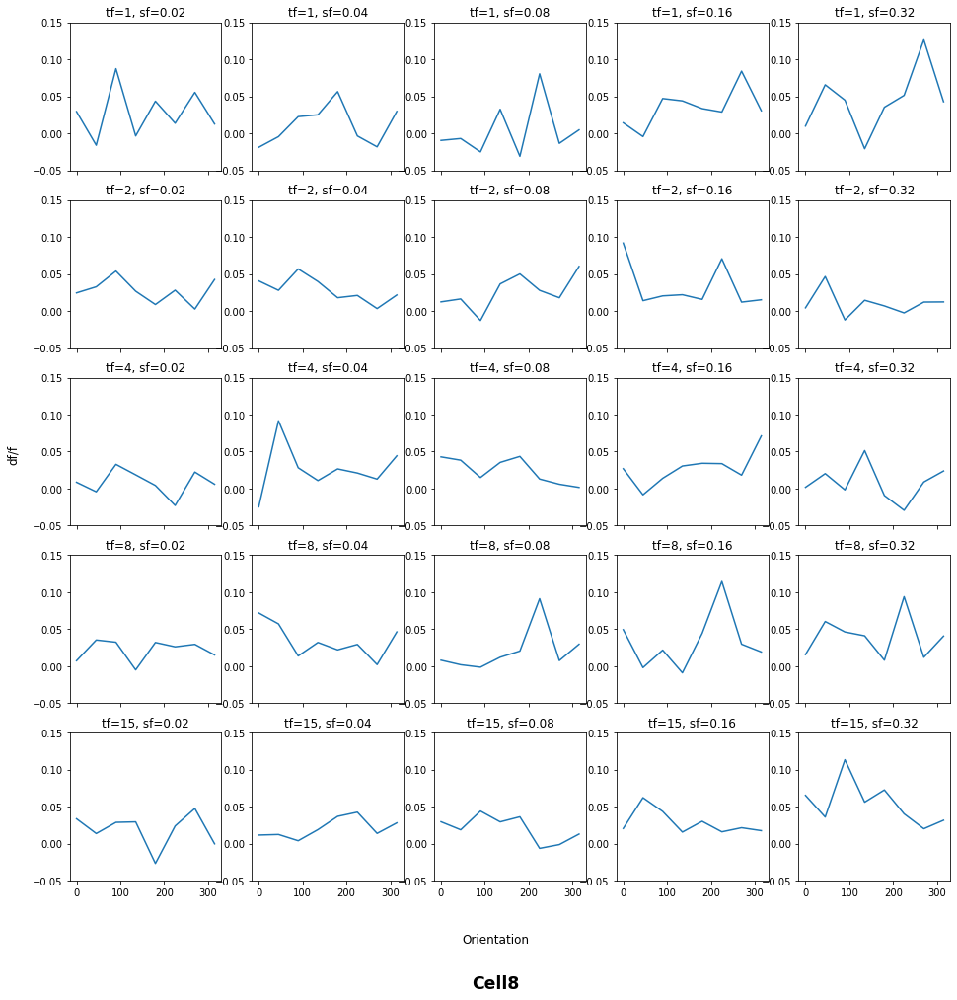

In [45]:
resultdf_cell8 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell8[i][j][k]
                                }
            resultdf_cell8.append(resultdf_element)
resultdf_cell8 = pd.DataFrame(resultdf_cell8)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell8[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.15)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell8', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

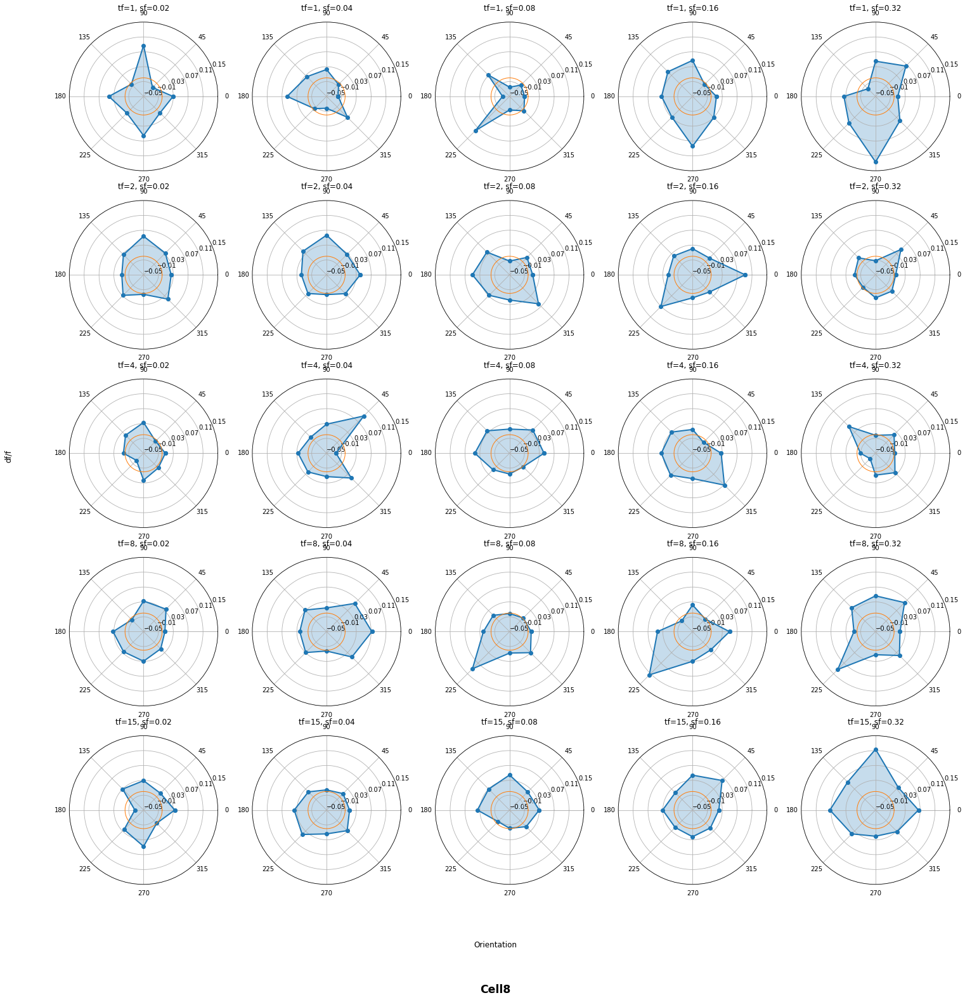

In [46]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell8[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.15, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell8', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [47]:
# cell9 [200:215, 260:280] 

results_cell9 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 200,bottom=215, left=260,right =280)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell9.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

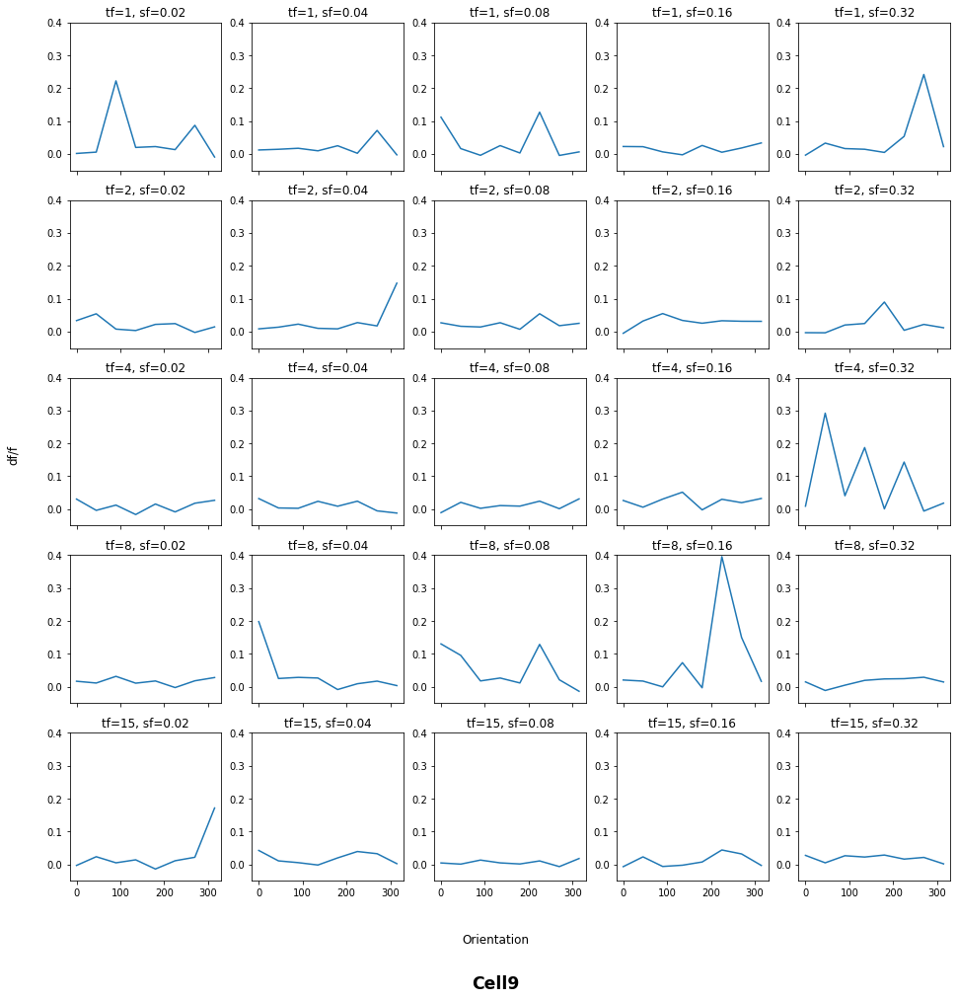

In [48]:
resultdf_cell9 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell9[i][j][k]
                                }
            resultdf_cell9.append(resultdf_element)
resultdf_cell9 = pd.DataFrame(resultdf_cell9)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell9[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.4)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell9', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

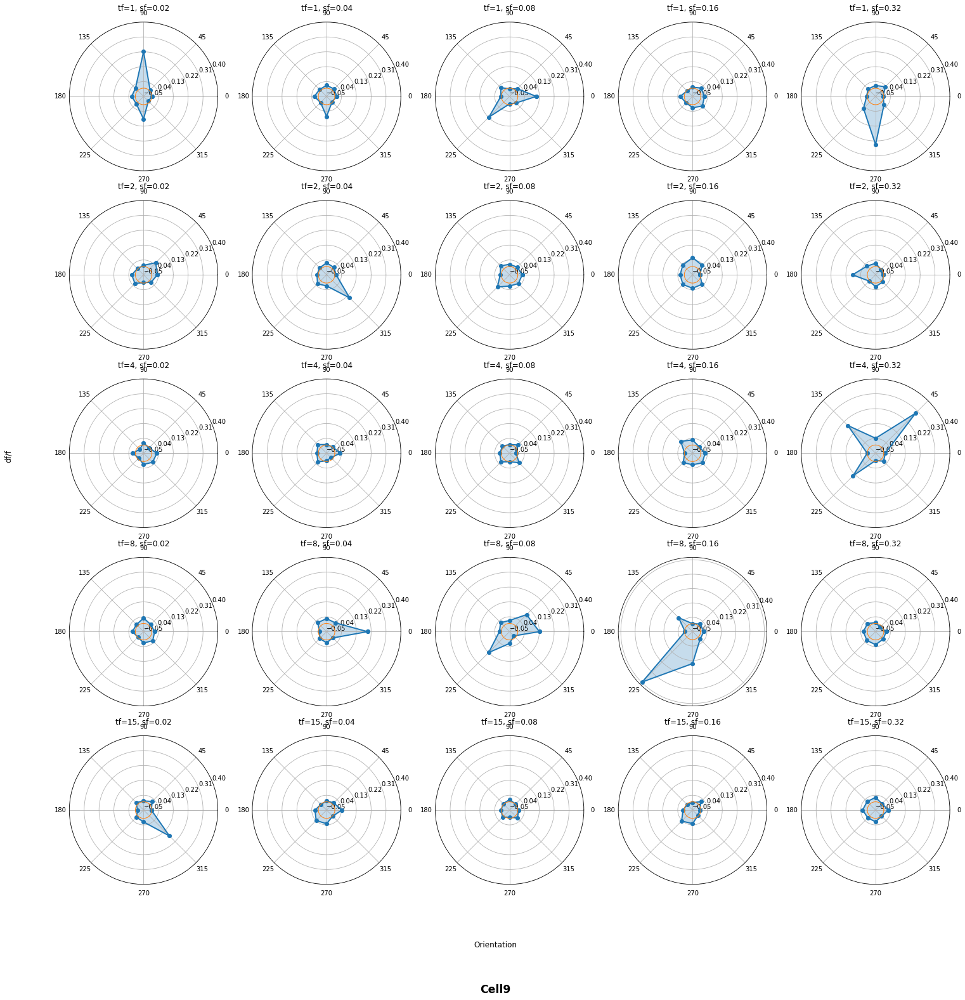

In [49]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell9[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.4, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell9', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [50]:
# cell10 [140:152,397:420]
results_cell10 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 140,bottom=152, left=397,right=420)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell10.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

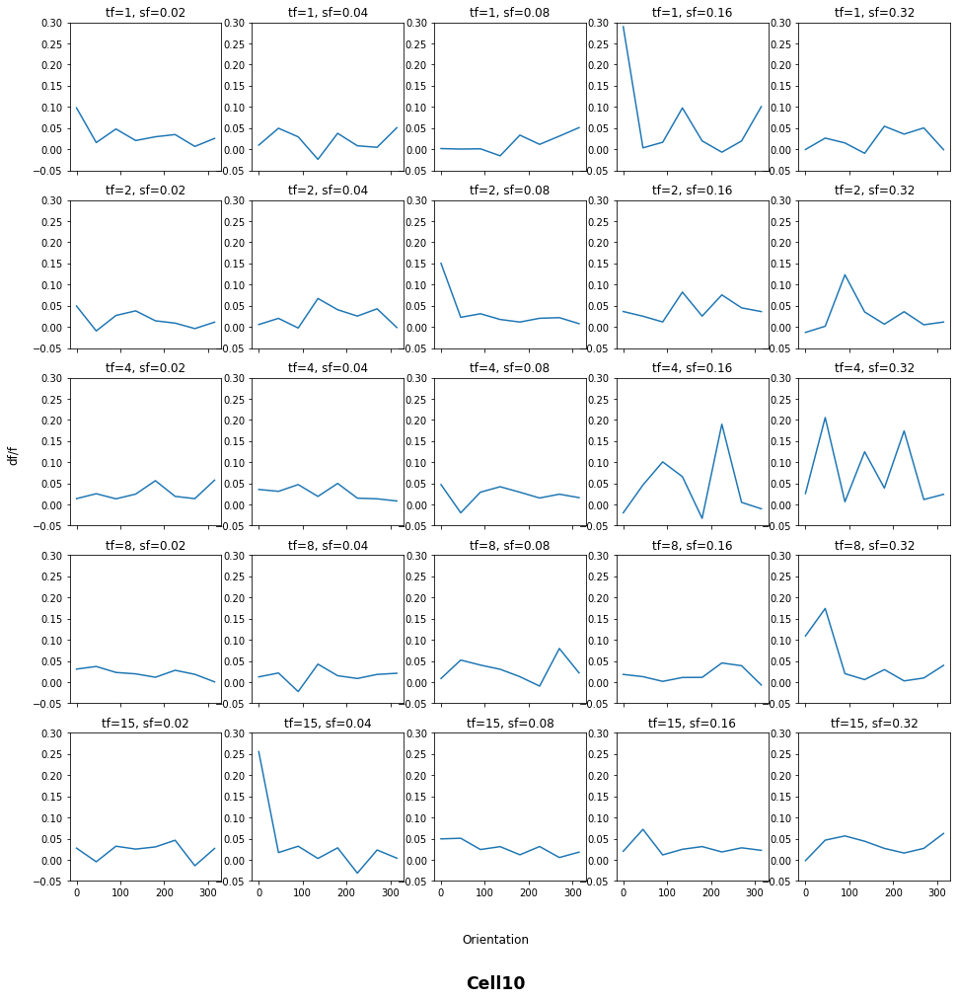

In [51]:
resultdf_cell10 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell10[i][j][k]
                                }
            resultdf_cell10.append(resultdf_element)
resultdf_cell10 = pd.DataFrame(resultdf_cell10)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell10[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.3)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell10', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

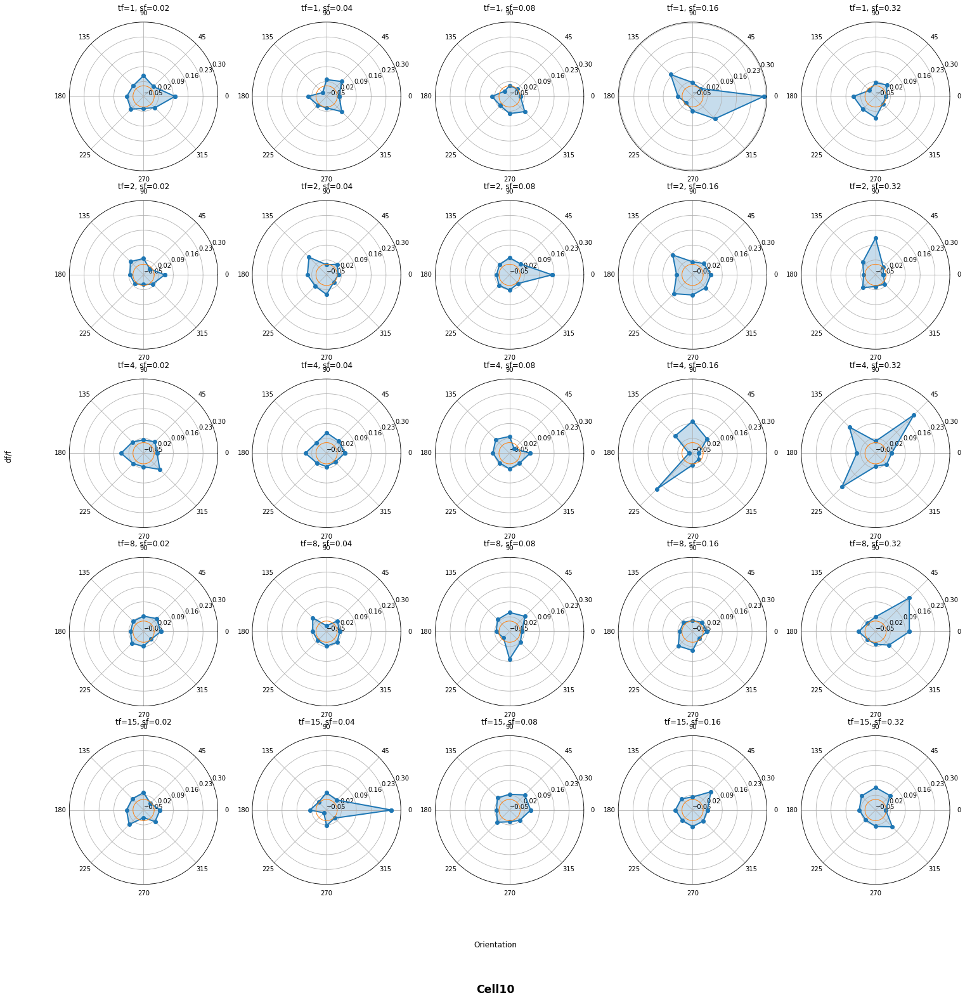

In [52]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell10[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.3, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell10', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [53]:
# cell14 [240:250, 180:195]
results_cell14 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 240,bottom=250, left=180,right=195)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell14.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

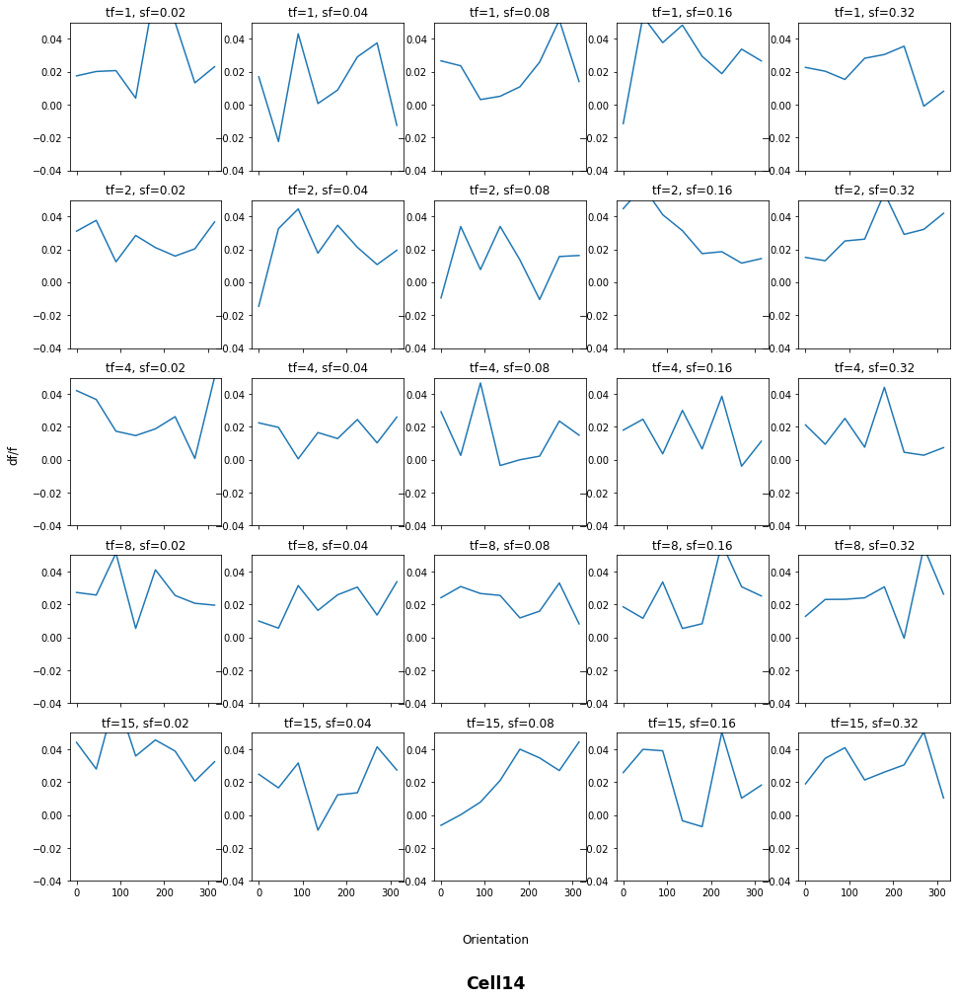

In [54]:
resultdf_cell14 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell14[i][j][k]
                                }
            resultdf_cell14.append(resultdf_element)
resultdf_cell14 = pd.DataFrame(resultdf_cell14)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell14[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.04, 0.05)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell14', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

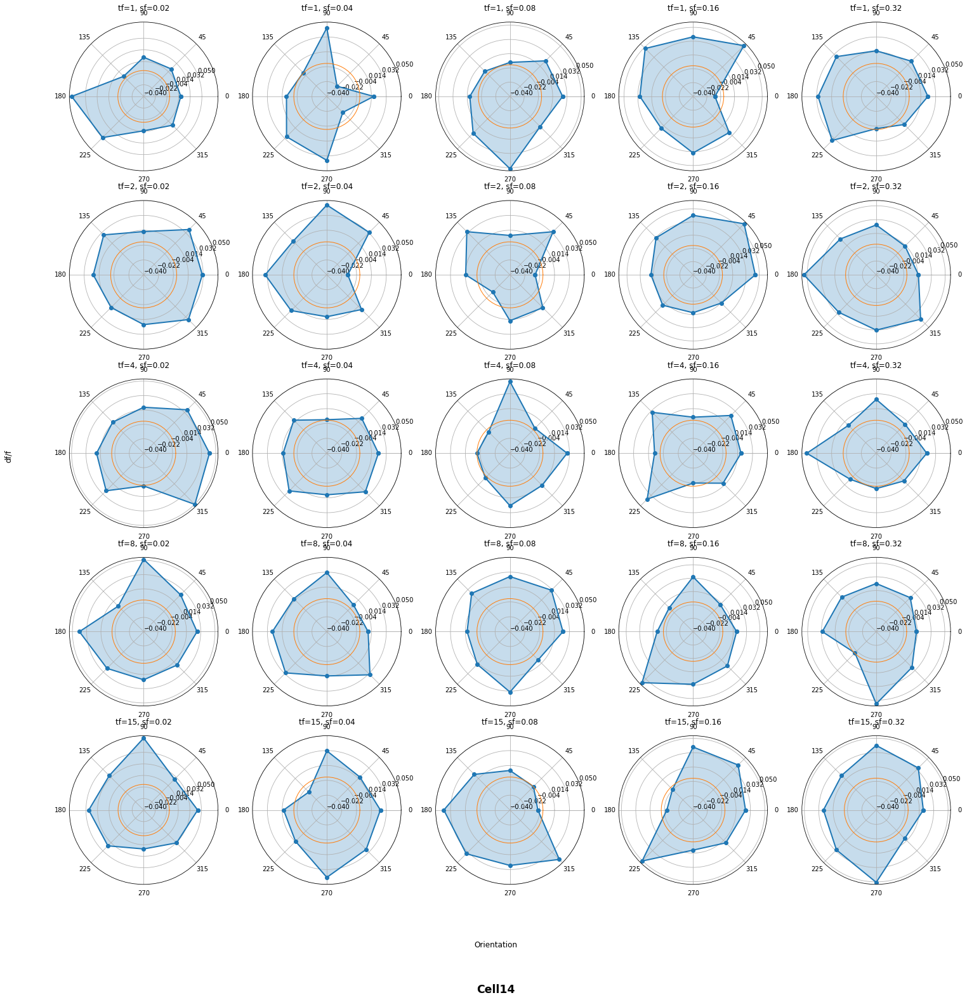

In [55]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell14[i][j] # make changes.
        
        markers = np.linspace(-0.04, 0.05, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell14', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [56]:
# Cell15 [228:245,248:260]

results_cell15 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 228,bottom=245, left=248,right=260)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell15.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

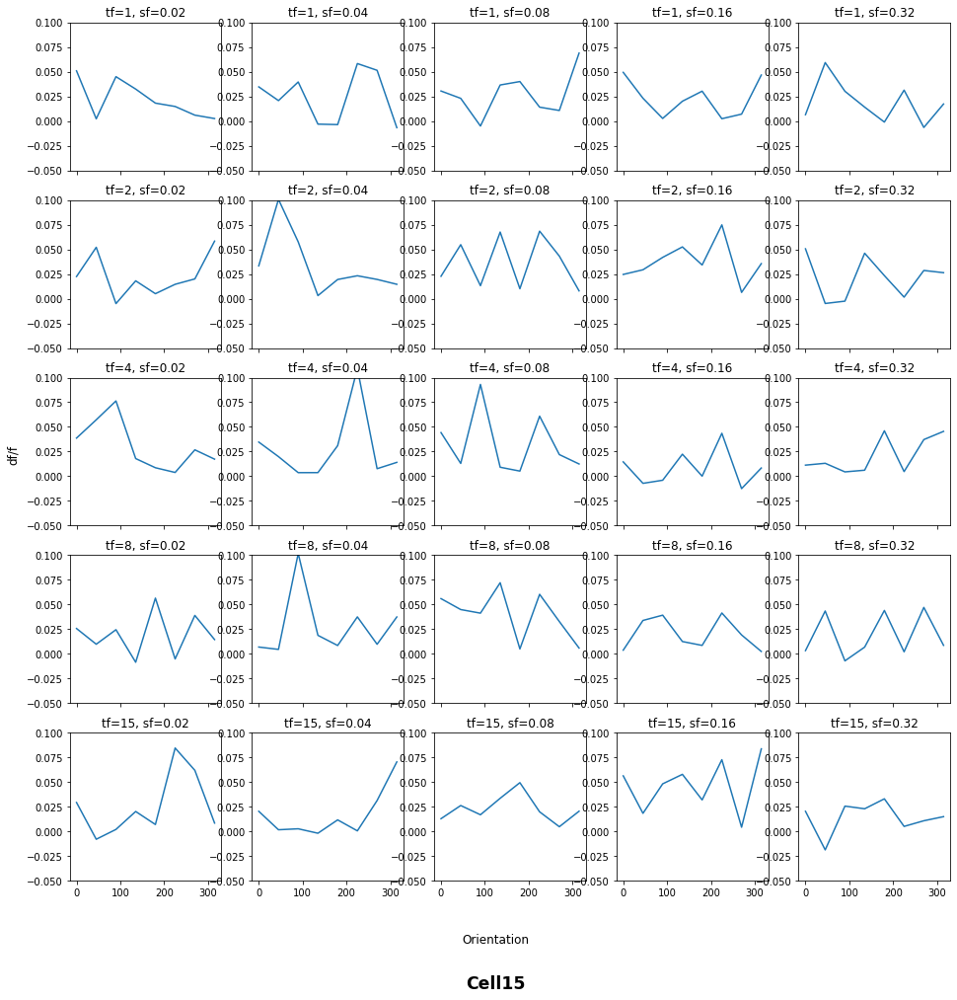

In [57]:
resultdf_cell15 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell15[i][j][k]
                                }
            resultdf_cell15.append(resultdf_element)
resultdf_cell15 = pd.DataFrame(resultdf_cell15)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell15[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.1)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell15', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

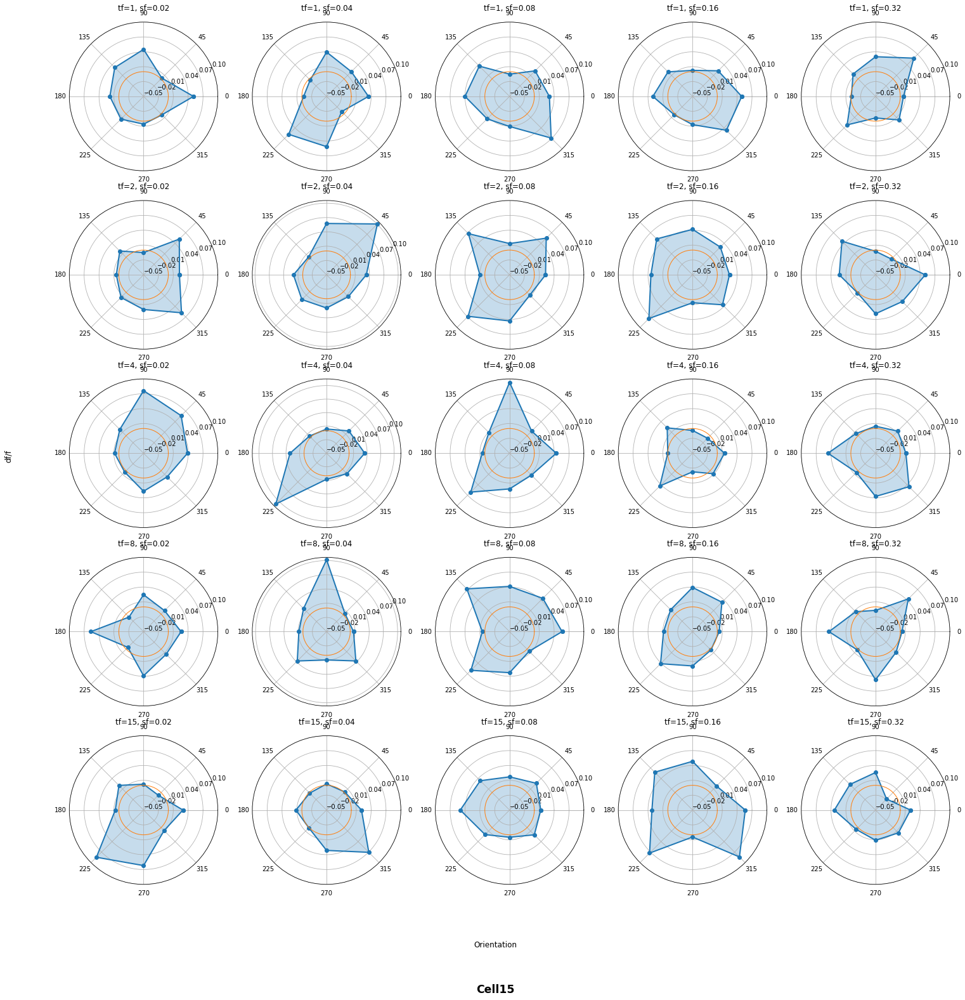

In [58]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell15[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.1, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell15', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [59]:
# Cell16 [272:284,248:267]
results_cell16 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 272,bottom=284, left=248,right=267)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell16.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

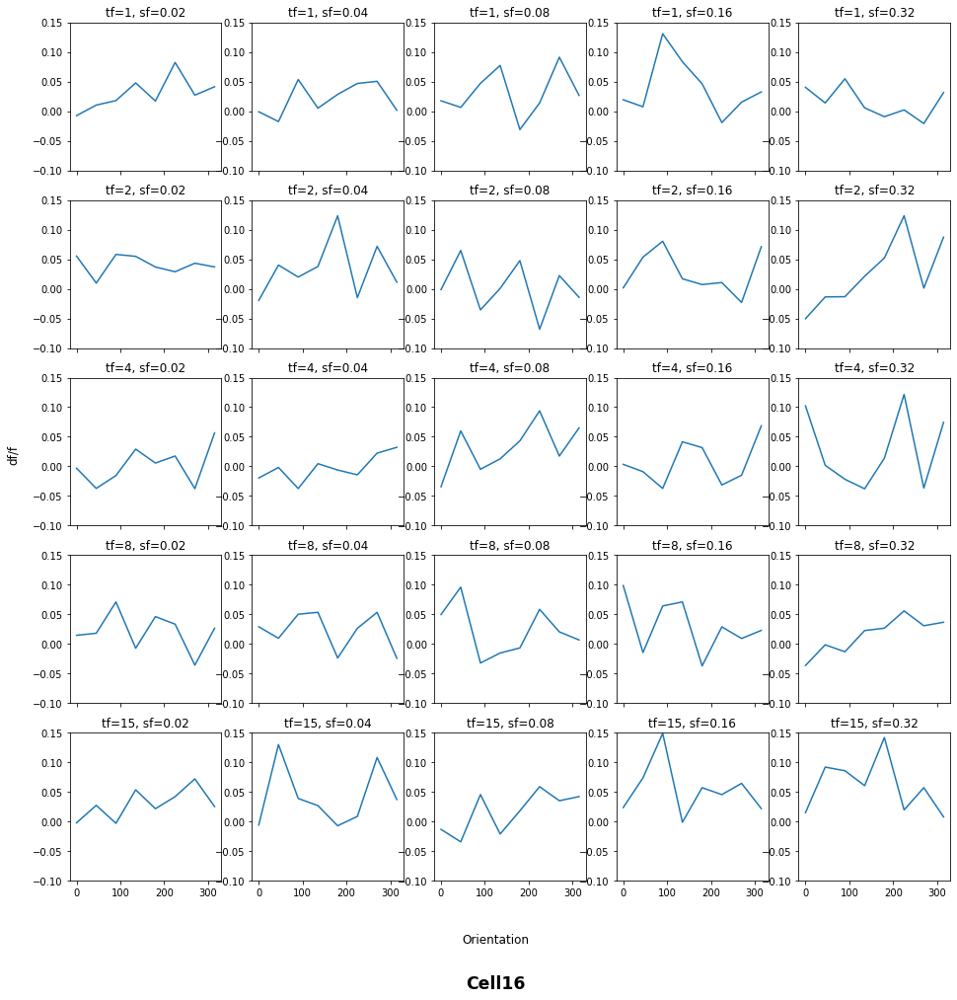

In [60]:
resultdf_cell16 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell16[i][j][k]
                                }
            resultdf_cell16.append(resultdf_element)
resultdf_cell16 = pd.DataFrame(resultdf_cell16)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell16[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.1, 0.15)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell16', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

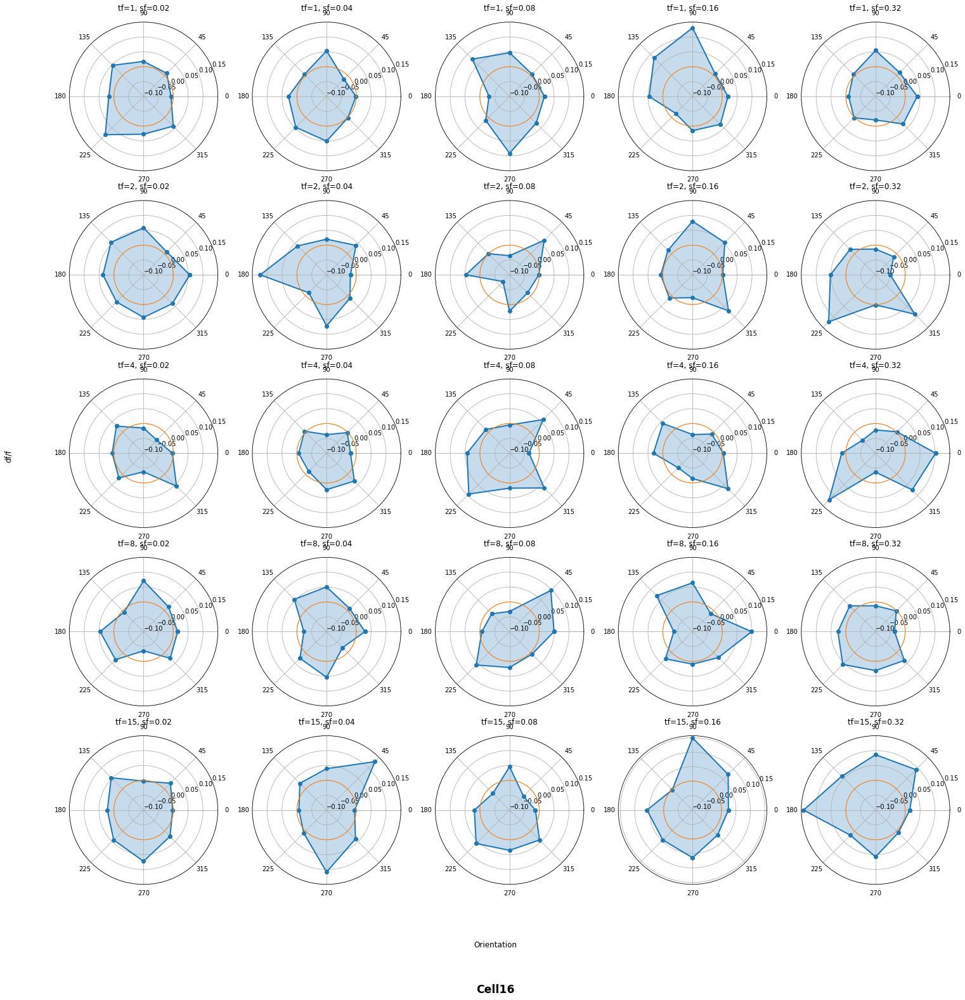

In [61]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell16[i][j] # make changes.
        
        markers = np.linspace(-0.1, 0.15, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell16', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [62]:
# Cell17 [125:142,142:168]
results_cell17 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 125,bottom=142, left=142,right=168)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell17.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

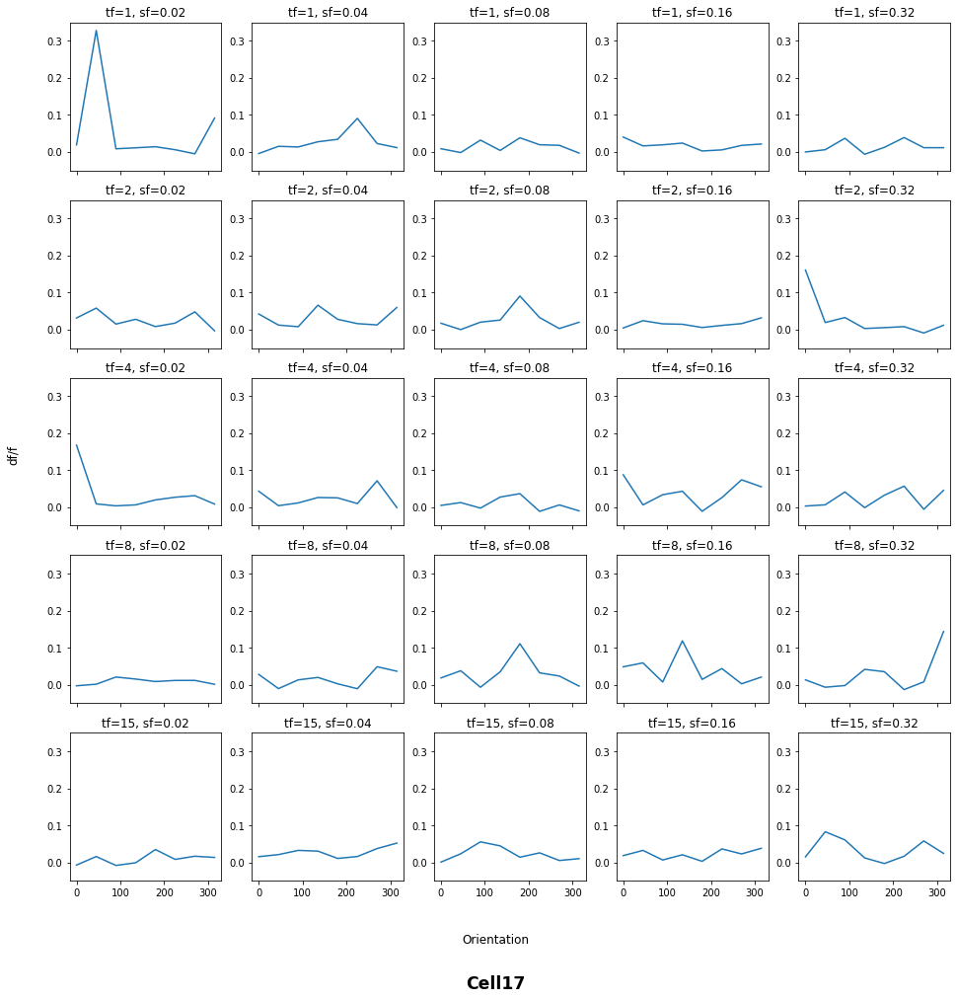

In [63]:
resultdf_cell17 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell17[i][j][k]
                                }
            resultdf_cell17.append(resultdf_element)
resultdf_cell17 = pd.DataFrame(resultdf_cell17)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell17[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.35)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell17', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

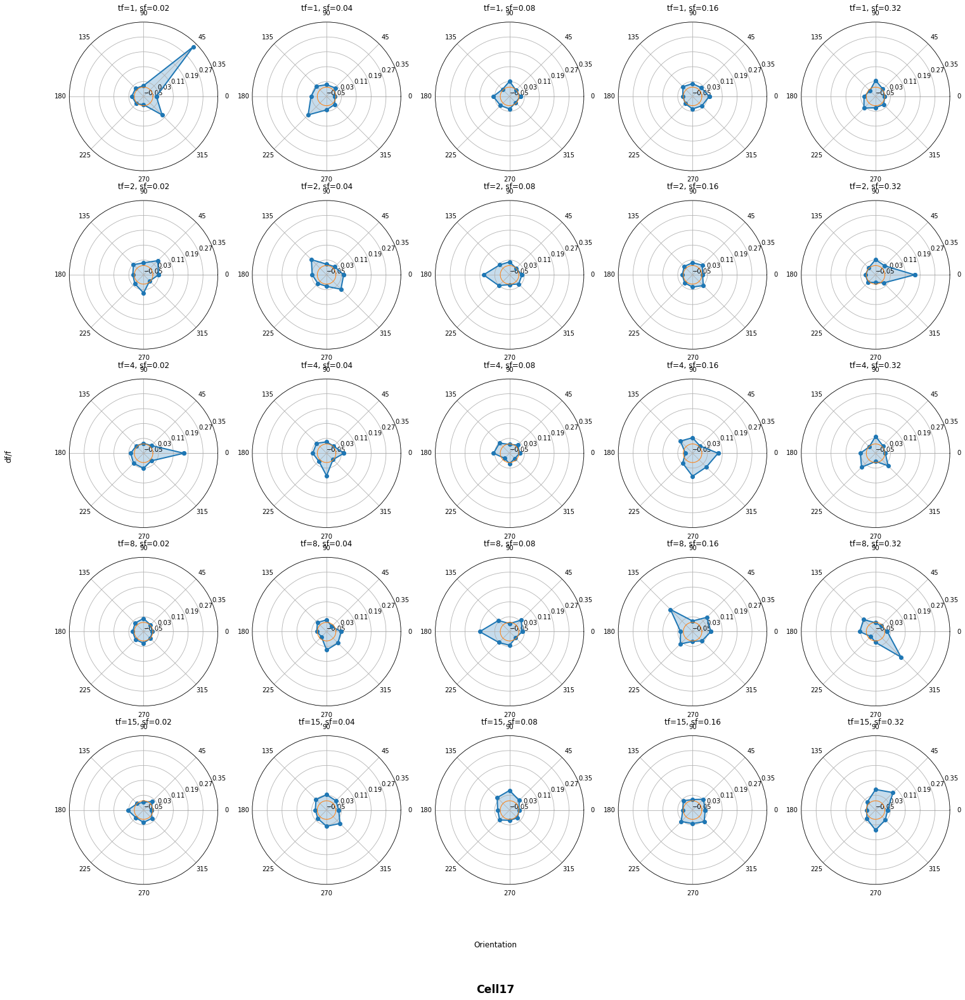

In [64]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell17[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.35, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell17', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [65]:
# Cell18 [297:307,364:378]
results_cell18 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 297,bottom=307, left=364,right=378)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell18.append(ts) #3 dimensions: 5tf 5sf 8ori


Text(0.07, 0.5, 'df/f')

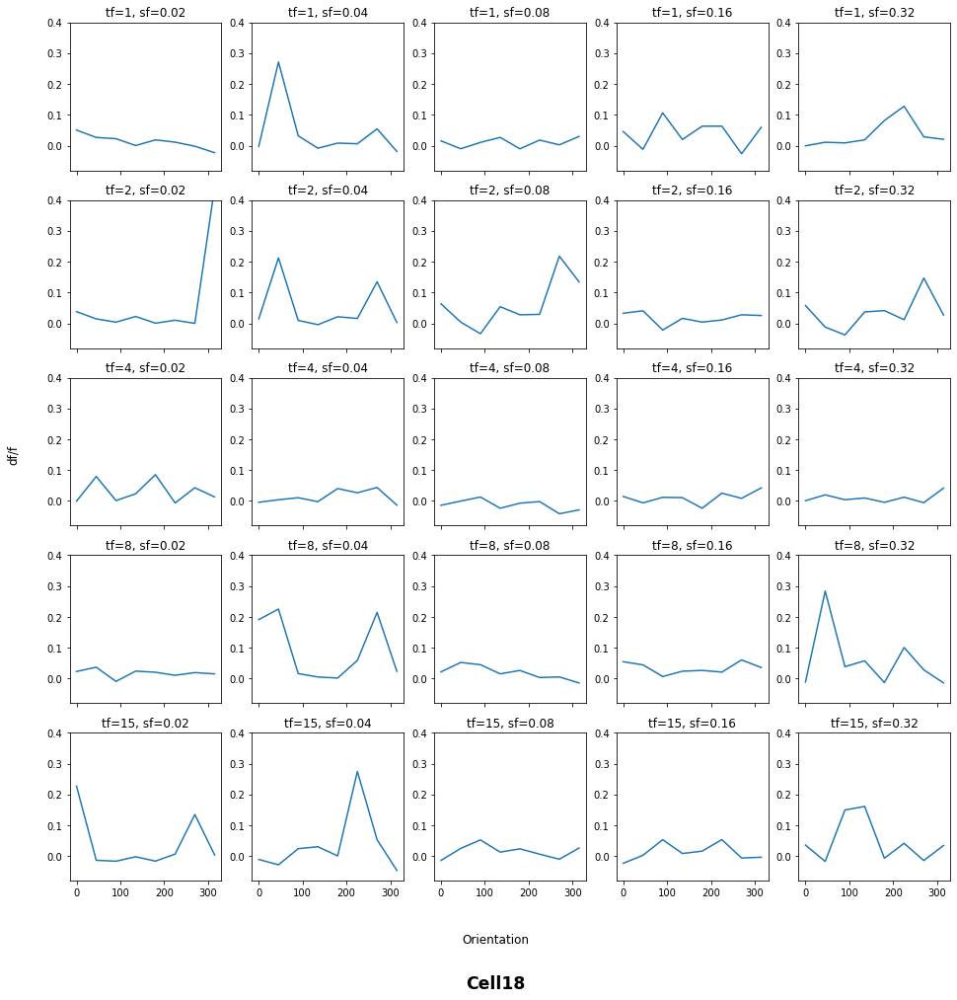

In [66]:
resultdf_cell18 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell18[i][j][k]
                                }
            resultdf_cell18.append(resultdf_element)
resultdf_cell18 = pd.DataFrame(resultdf_cell18)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell18[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.08, 0.4)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell18', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

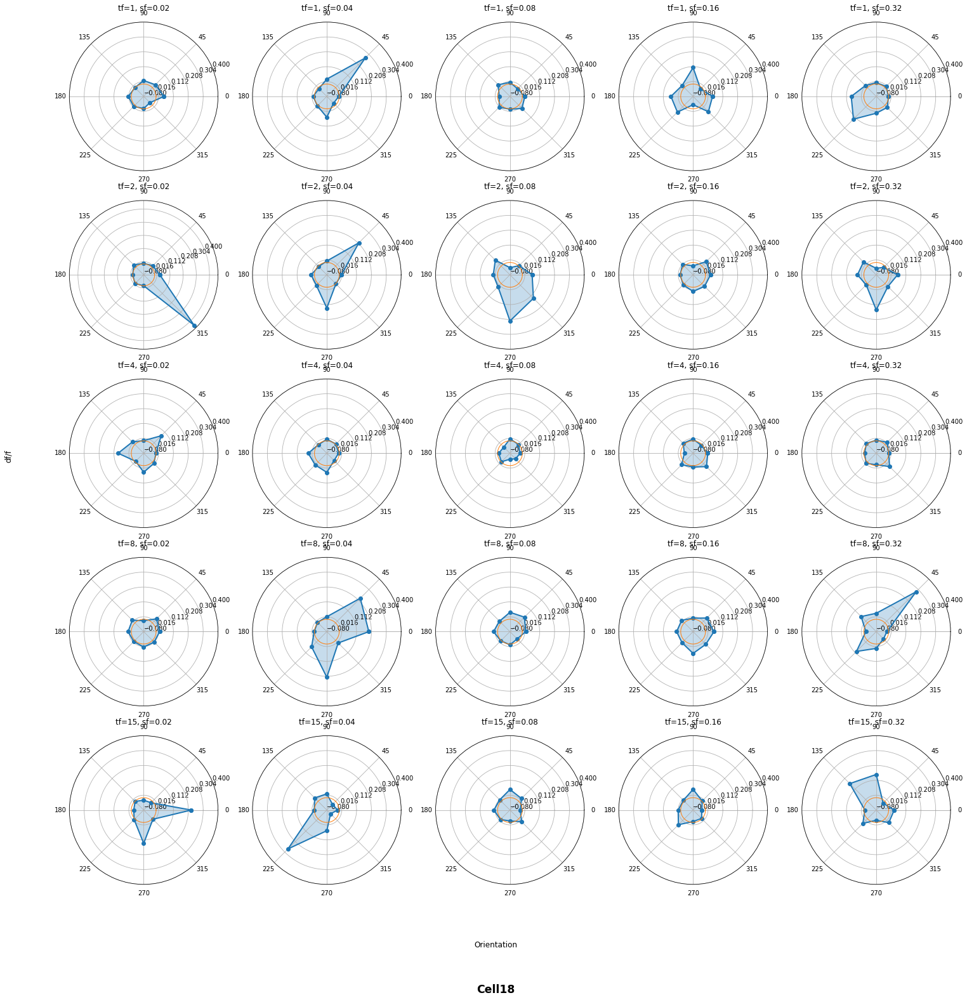

In [67]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell18[i][j] # make changes.
        
        markers = np.linspace(-0.08, 0.4, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell18', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [14]:
# cell11 [168:181,315:333]
results_cell11 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 168,bottom=181, left=315,right=333)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell11.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

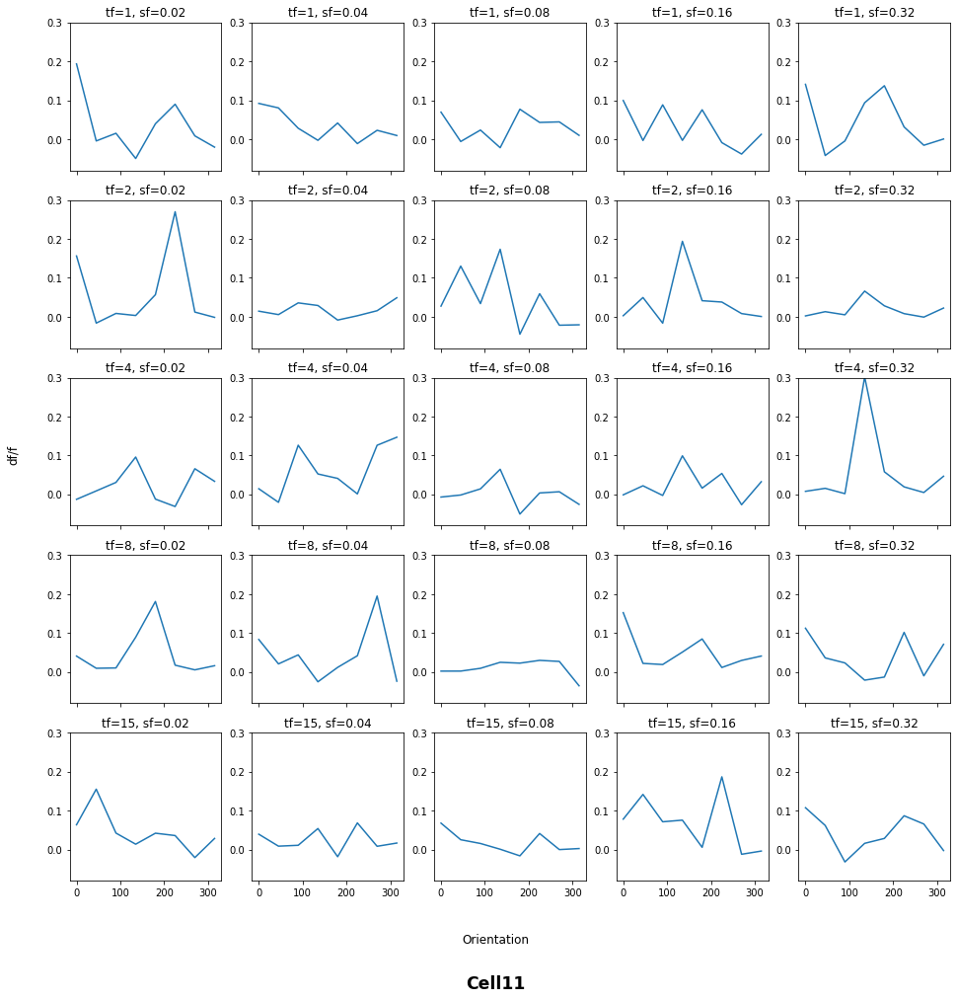

In [15]:
resultdf_cell11 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell11[i][j][k]
                                }
            resultdf_cell11.append(resultdf_element)
resultdf_cell11 = pd.DataFrame(resultdf_cell11)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell11[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.08, 0.3)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell11', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

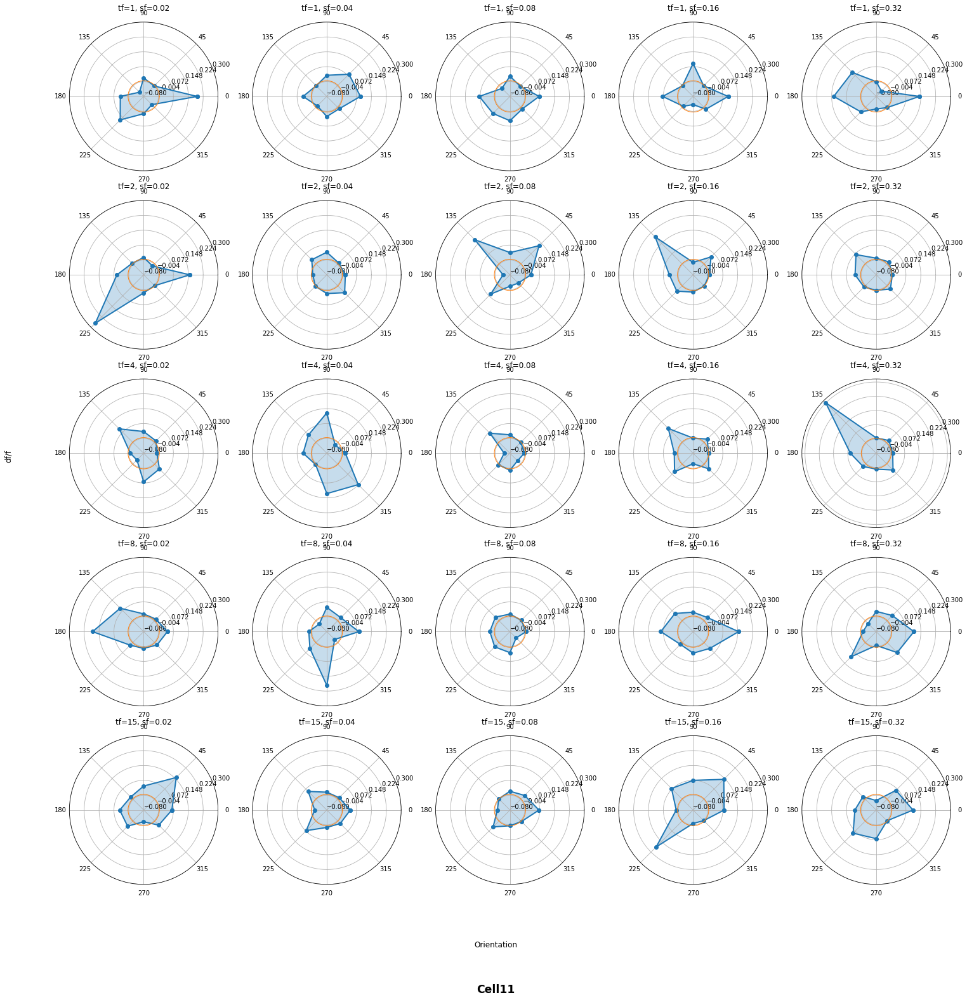

In [16]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell11[i][j] # make changes.
        
        markers = np.linspace(-0.08, 0.3, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell11', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [17]:
# cell12 [342:355,255:272]
results_cell12 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 342,bottom=355, left=255,right=272)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell12.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

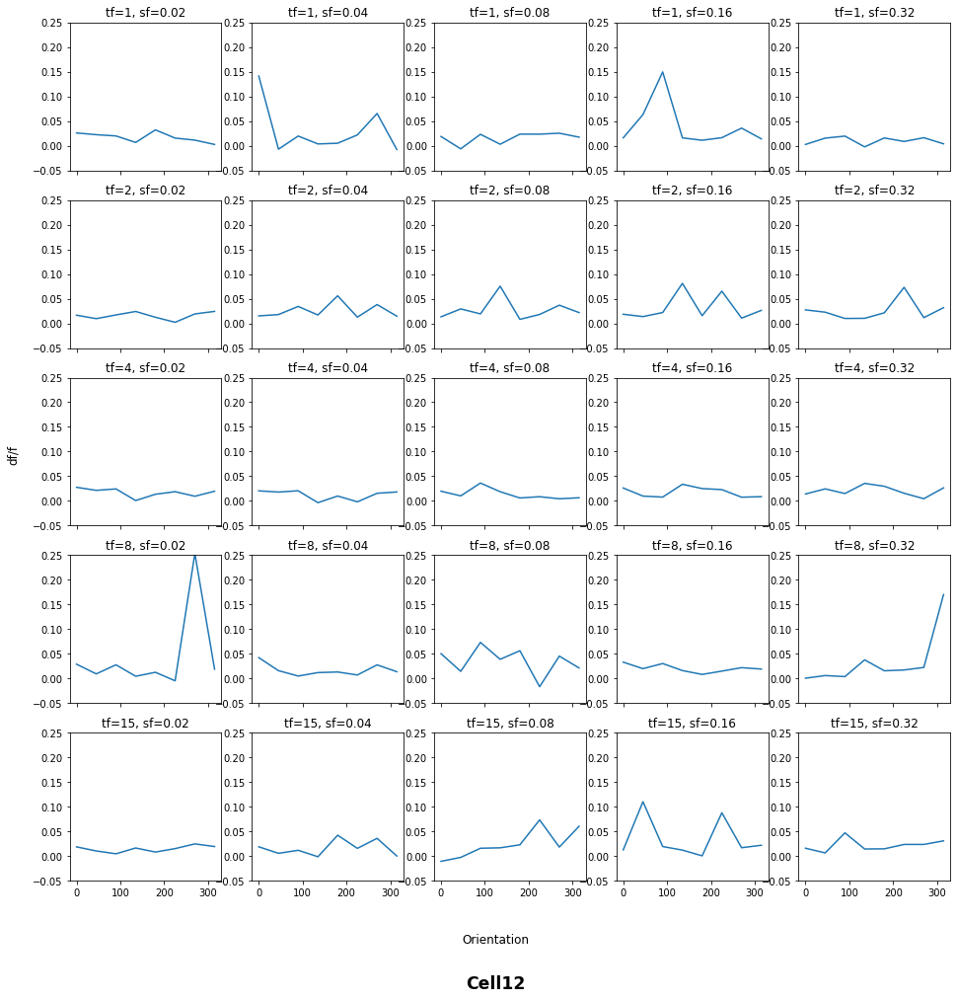

In [18]:
resultdf_cell12 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell12[i][j][k]
                                }
            resultdf_cell12.append(resultdf_element)
resultdf_cell12 = pd.DataFrame(resultdf_cell12)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell12[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.05, 0.25)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell12', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

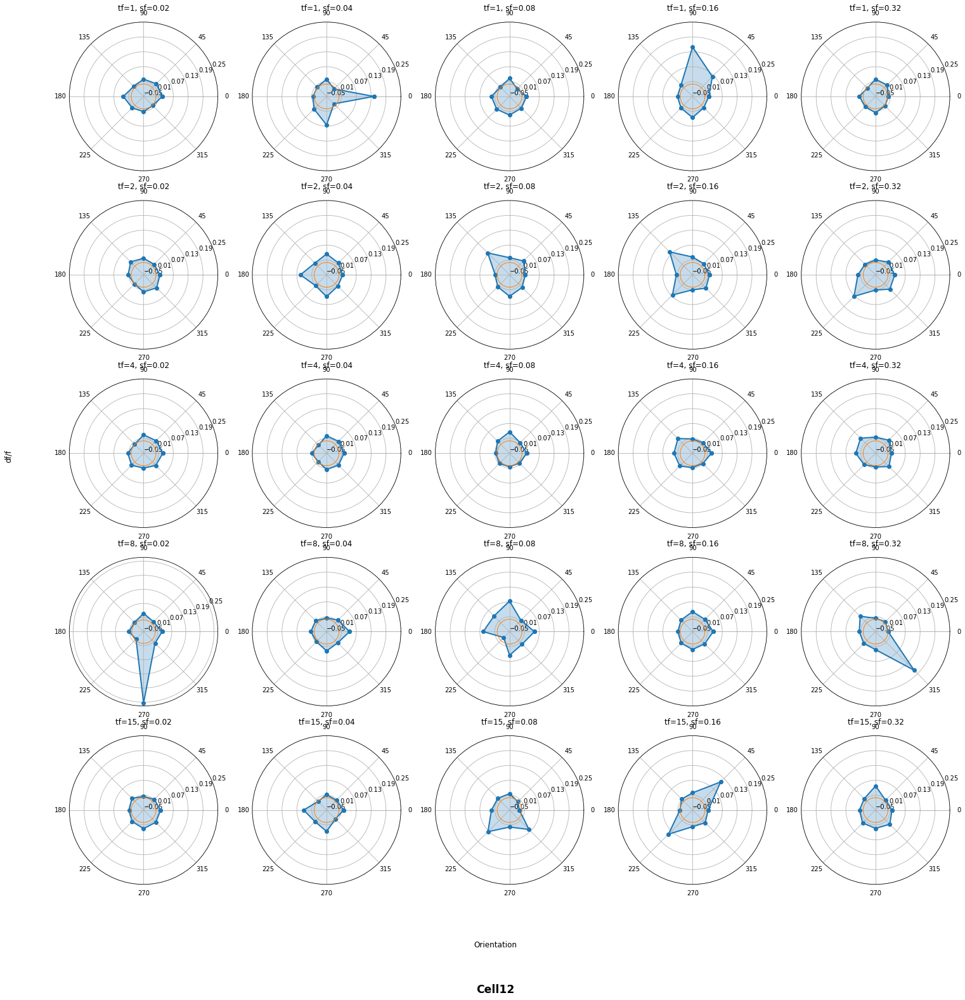

In [19]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell12[i][j] # make changes.
        
        markers = np.linspace(-0.05, 0.25, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell12', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [20]:
# cell13 [182:190,265:278]
results_cell13 = []
for tfreq in tfs:
    ts = []
    for sfreq in sfs:
        tso = []
        for orientation in oris:
            tso_element = cal_idx2(ori = orientation,tf = tfreq,sf = sfreq, 
                                   top = 182,bottom=190, left=265,right=278)
            tso_element = np.mean(tso_element)
            tso.append(tso_element)
        ts.append(tso)
    results_cell13.append(ts) #3 dimensions: 5tf 5sf 8ori

Text(0.07, 0.5, 'df/f')

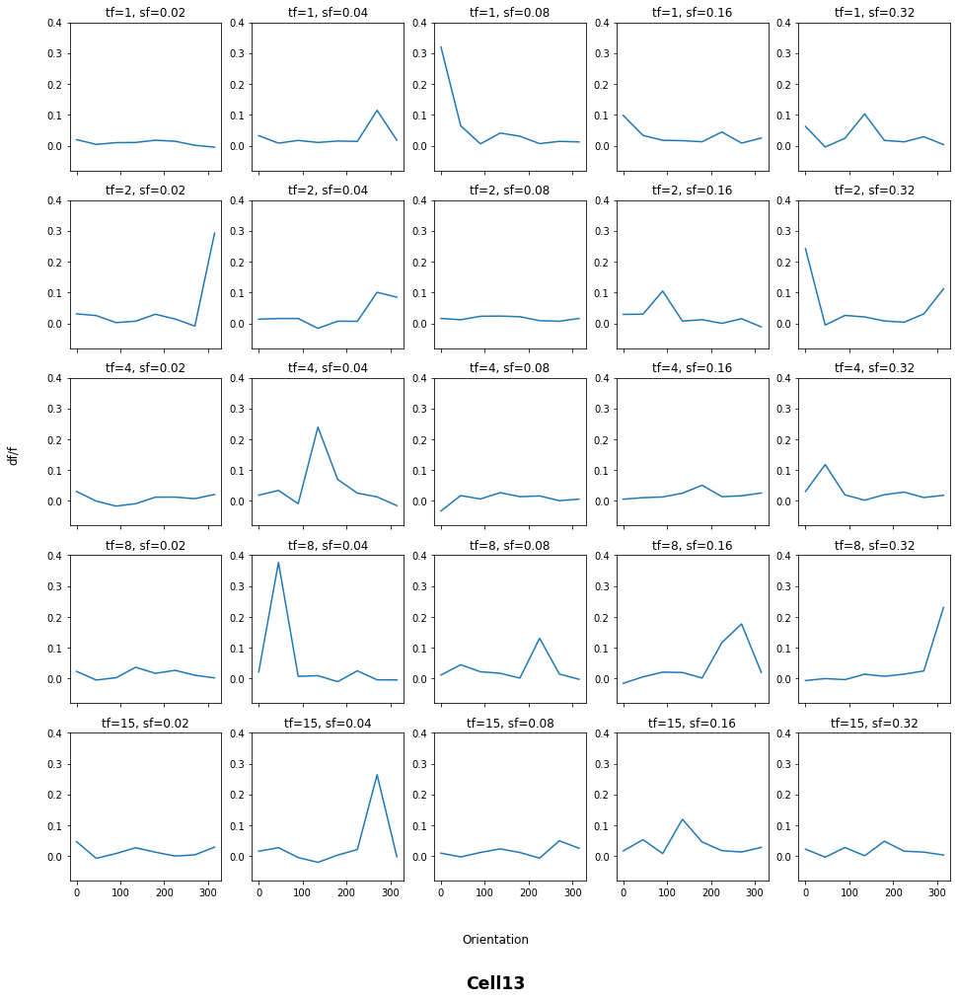

In [21]:
resultdf_cell13 = []
resultdf_element = []
for i, tfreq in enumerate(tfs):
    for j, sfreq in enumerate(sfs):
        for k, orientation in enumerate(oris):
            resultdf_element = {
                                'tf':tfreq,
                                'sf':sfreq,
                                'ori':orientation,
                                'dff':results_cell13[i][j][k]
                                }
            resultdf_cell13.append(resultdf_element)
resultdf_cell13 = pd.DataFrame(resultdf_cell13)

# tuning curve under all conditions
fig, axes = plt.subplots(nrows=5, ncols=5, sharex=True, figsize=(16, 16))
for i in np.arange(5):
    for j in np.arange(5):
        axes[i,j].plot(oris, results_cell13[i][j]) #row:tf, column:sf
        axes[i,j].set_ylim(-0.08, 0.4)
        axes[i,j].set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))
fig.text(0.5, 0.03, 'Cell13', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

Text(0.07, 0.5, 'df/f')

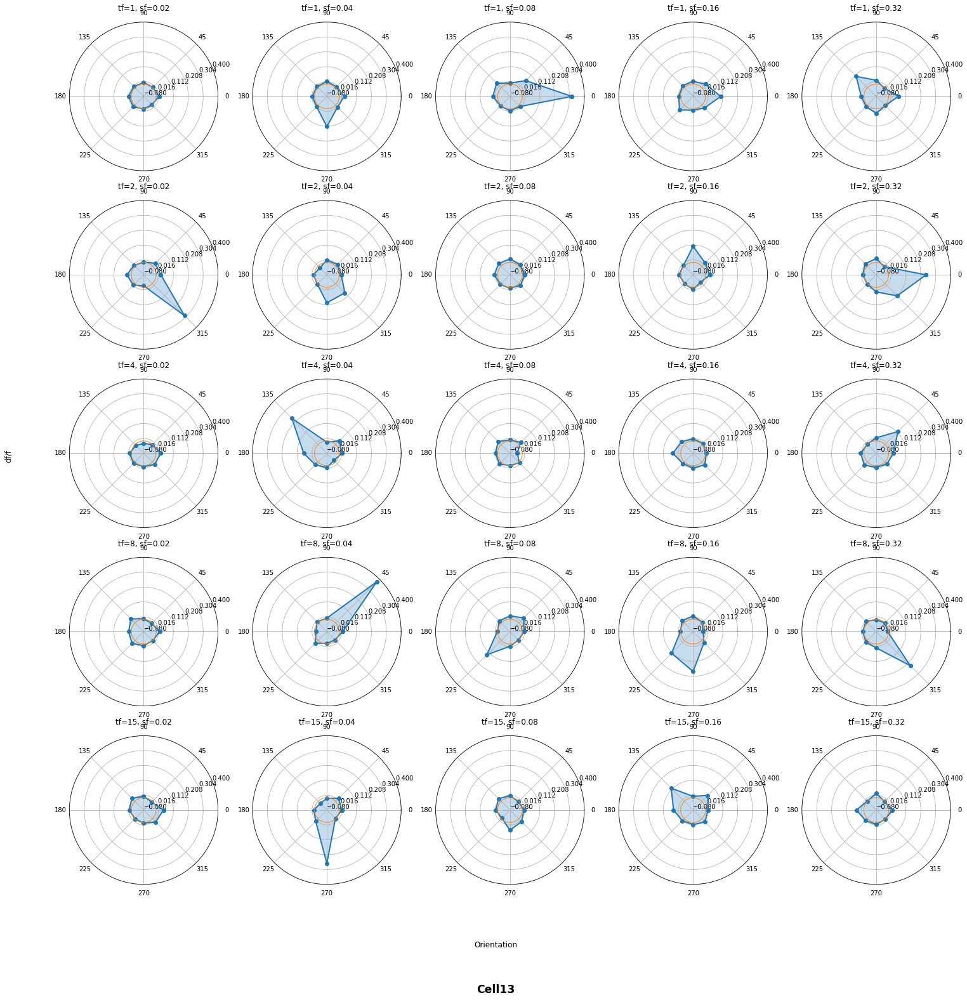

In [22]:
fig= plt.figure(figsize=(25, 25))
for i in np.arange(5):
    for j in np.arange(5):
        stats = results_cell13[i][j] # make changes.
        
        markers = np.linspace(-0.08, 0.4, 6) # make changes.
        labels = np.array(oris)
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))
        
        circle = np.linspace(0, 2*np.pi, endpoint=False)
        circle = np.concatenate((circle,[circle[0]]))
        
        ax = fig.add_subplot(5,5,i*5+j+1, polar=True)

        ax.plot(angles, stats, 'o-', linewidth=2)
        ax.fill(angles, stats, alpha=0.25)
        ax.plot(circle, np.zeros_like(circle), '-', linewidth=1)
        ax.set_thetagrids(angles * 180/np.pi, labels)
        plt.yticks(markers)
        ax.set_title('tf='+str(tfs[i])+', sf='+str(sfs[j]))

fig.text(0.5, 0.03, 'Cell13', ha='center',size = 'xx-large',fontweight = 'heavy')
fig.text(0.5, 0.07, 'Orientation', ha='center',size = 'large')
fig.text(0.07, 0.5, 'df/f', va='center', rotation='vertical',size = 'large')

In [68]:
def cal_DSI(resultdata):
    zancun = resultdata[['tf','sf','dff']].groupby(['tf','sf']).max()
    zancun = np.array(zancun['dff'])
    zancun2 = resultdata.loc[resultdata['dff'].isin(zancun)]
    zuidadejiaodumen = np.array(zancun2['ori'])
    nonpreferjiaodu = (zuidadejiaodumen+180)%360
    
    nonpreferdff = []
    for i, sometf in enumerate(zancun2['tf']):
#         print(i,sometf,list(zancun2['sf'])[i],nonpreferjiaodu[i])
        sometf=sometf
        somesf=list(zancun2['sf'])[i]
        someori=nonpreferjiaodu[i]
        someelement = resultdata[(resultdata["tf"]==sometf) 
                        & (resultdata["sf"]==somesf) 
                        & (resultdata["ori"]==someori)]['dff']
        nonpreferdff.append(np.array(someelement)[0])

    zancun3 = zancun2.rename(columns={'dff':'preferdff','ori':'preferori'})
    zancun3['nonpreferdff']=nonpreferdff

    zancun3['DSI'] = (zancun3['preferdff']-zancun3['nonpreferdff'])/zancun3['preferdff']
    return zancun3


In [69]:
DSI_dataset = []
for i in range(1,18+1):
    name='resultdf_cell'+str(i)
    currentdata = locals()[name]
    DSI_dataset.append(cal_DSI(currentdata))

In [79]:
DSI_allcell = []
for i in range(18):
    DSI_dataset[i]['cell']=i+1
    DSI_allcell.append(DSI_dataset[i])
DSI_dataset =  DSI_allcell


In [81]:
DSI_allcell1 ={'cell':np.array(DSI_dataset[0]['cell']),
                'tf':np.array(DSI_dataset[0]['tf']),
                'sf':np.array(DSI_dataset[0]['sf']),
                'preferori':np.array(DSI_dataset[0]['preferori']),
                'preferdff':np.array(DSI_dataset[0]['preferdff']),
                'nonpreferdff':np.array(DSI_dataset[0]['nonpreferdff']),
                'DSI':np.array(DSI_dataset[0]['DSI'])}
DSI_allcell1 = pd.DataFrame(DSI_allcell1)
for i in range(1,18):
    # i=2
    DSI_dataset[i]['cell']=i+1
    DSI_allcell_element1 = {
                        'cell':np.array(DSI_dataset[i]['cell']),
                        'tf':np.array(DSI_dataset[i]['tf']),
                        'sf':np.array(DSI_dataset[i]['sf']),
                        'preferori':np.array(DSI_dataset[i]['preferori']),
                        'preferdff':np.array(DSI_dataset[i]['preferdff']),
                        'nonpreferdff':np.array(DSI_dataset[i]['nonpreferdff']),
                        'DSI':np.array(DSI_dataset[i]['DSI'])
                        }
    DSI_allcell_element1=pd.DataFrame(DSI_allcell_element1)
    DSI_allcell1 = DSI_allcell1.append(DSI_allcell_element1)

In [83]:
import scipy.stats as stats

In [84]:
stats.f_oneway(DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.02)], 
             DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.04)],
             DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.08)],
              DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.16)],
              DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.32)])

F_onewayResult(statistic=1.0229914436039718, pvalue=0.40020672101764265)

In [85]:
stats.f_oneway(DSI_allcell1['DSI'][(DSI_allcell1.tf == 1) & (DSI_allcell1.sf == 0.04)], 
             DSI_allcell1['DSI'][(DSI_allcell1.tf == 2) & (DSI_allcell1.sf == 0.04)],
             DSI_allcell1['DSI'][(DSI_allcell1.tf == 4) & (DSI_allcell1.sf == 0.04)],
              DSI_allcell1['DSI'][(DSI_allcell1.tf == 8) & (DSI_allcell1.sf == 0.04)],
              DSI_allcell1['DSI'][(DSI_allcell1.tf == 15) & (DSI_allcell1.sf == 0.04)])

F_onewayResult(statistic=0.7911139651331142, pvalue=0.5341532741894741)

In [138]:
# from statsmodels.formula.api import ols
# from statsmodels.stats.anova import anova_lm
# from statsmodels.graphics.factorplots import interaction_plot

In [143]:
# formula = 'DSI ~ tf + sf'
# anova_results = anova_lm(ols(formula,DSI_allcell1).fit())
# print(anova_results)

In [90]:
DSI_allcell1.to_csv("DSI_allcell.csv")

In [91]:
meanDSI =pd.DataFrame(columns = ["tf", "sf", "mean_DSI"])
for i in tfs:
    for j in sfs:
        mean_DSI = np.mean(DSI_allcell1['DSI'][(DSI_allcell1.tf == i) & (DSI_allcell1.sf == j)])
        meanDSIelement = {
                        'tf':i,
                        'sf':j,
                        'mean_DSI':mean_DSI
                        }
#         meanDSIelement = pd.DataFrame(meanDSIelement)
        meanDSI = meanDSI.append(meanDSIelement,ignore_index=True)

Text(0.5, -0.1, 'DSI')

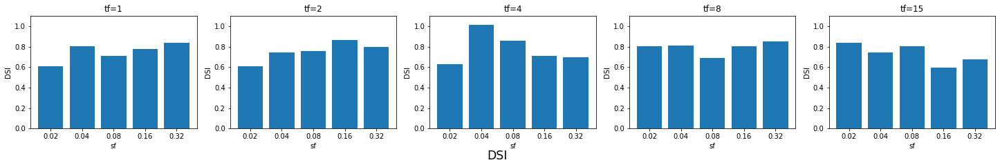

In [121]:
fig, axes=plt.subplots(nrows=1, ncols=5, figsize=(25, 3),)
for i,sometf in enumerate(tfs):
    labels = list(sfs)
    axes[i].bar([1,2,3,4,5], meanDSI[meanDSI.tf==sometf].mean_DSI,width=0.8,tick_label=labels)
    axes[i].set_title(('tf=' +str(sometf)))
    axes[i].set_xlabel('sf')
    axes[i].set_ylabel('DSI')
    axes[i].set_ylim(0, 1.1)
fig.suptitle('DSI',ha='center',va='bottom',y = -0.10,size='xx-large')

Text(0.5, -0.1, 'DSI')

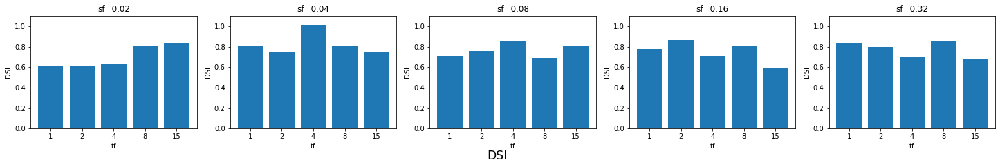

In [122]:
fig, axes=plt.subplots(nrows=1, ncols=5, figsize=(25, 3))
for i,somesf in enumerate(sfs):
    labels = list(tfs)
    axes[i].bar([1,2,3,4,5], meanDSI[meanDSI.sf==somesf].mean_DSI,width=0.8,tick_label=labels)
    axes[i].set_title(('sf=' +str(somesf)))
    axes[i].set_xlabel('tf')
    axes[i].set_ylabel('DSI')
    axes[i].set_ylim(0, 1.1)
fig.suptitle('DSI',ha='center',va='bottom',y = -0.10,size='xx-large')